In [1]:
import time
import os
import pandas as pd
import numpy as np
import mma
import skimage
import matplotlib.pyplot as plt

plt.rcParams['animation.ffmpeg_path'] = '/home/jparkin/anaconda3/bin/ffmpeg'

from matplotlib import patches
import matplotlib.animation as anm
from scipy import ndimage as ndi
from scipy import optimize as opt
from scipy import signal

from IPython.display import HTML
from matplotlib.lines import Line2D
import matplotlib.colors as mpl_colors
import seaborn as sns

mpl_named_colors = ['gray', 'g', 'y', 'r', 'k', 'c']
# load acq

import importlib
mma = importlib.reload(mma)
acq = mma.Acquisition('/groups/murray-biocircuits/jparkin/movies/200626_finalday/img_1')


# These are all according to cor_pos_df.label integers, not cor_pos_df.pos integers. these must be 
# converted into cor_pos_df.pos integers. 
pad_vec=np.arange(37)
ir_pads = np.arange(19)
r_pads = np.arange(19,37)
jao_senders = np.concatenate([np.arange(9,17),
                              np.array([0,3,6,19,20,21,23,24,26,27,35,32,30])])
k25_senders = np.array([1,2,4,5,7,8,22,25,28,31,33,36])
deadcini_pulsers = np.array([17,18,35,34,32,30,29])

# setup converter
label_ind_grab = lambda x : np.int(x[3:])
label_inds = acq.cor_pos_df['label'].apply(label_ind_grab)
pos_inds = acq.cor_pos_df.index.values
conv_series = pd.DataFrame(index=label_inds, columns=['pos'], data=np.array(pos_inds))

# Convert them
ir_pads = conv_series.loc[ir_pads,'pos'].values
r_pads = conv_series.loc[r_pads,'pos'].values
jao_senders = conv_series.loc[jao_senders,'pos'].values
k25_senders = conv_series.loc[k25_senders,'pos'].values
deadcini_pulsers = conv_series.loc[deadcini_pulsers,'pos'].values

# These are according to files_df.pos positions and don't need to be converted
sender_present = [0,3,4,6,7,8,11,13,17,18,19,20,21,23,24,27,29,30,31,33,34]
skip_pads = np.array([1,2,5,4,9,10,12,8,30,0,23,18,17])
skip_pads = np.array([0,11,12,23])

# skip_pads = np.array([17,18,12,23,1,4,5,2])
columns = ['inducers','sender','deadcini','skip']
metadata_df = pd.DataFrame(index=pad_vec,columns=columns)
metadata_df.loc[ir_pads,'inducers'] = 'ir'
metadata_df.loc[r_pads,'inducers'] = 'r'
metadata_df.loc[jao_senders,'sender'] = 'jao'
metadata_df.loc[k25_senders,'sender'] = 'k25'
metadata_df.loc[:,'deadcini'] = False
metadata_df.loc[deadcini_pulsers,'deadcini'] = True
metadata_df.loc[:,'sender_present'] = False
metadata_df.loc[sender_present,'sender_present'] = True
metadata_df.loc[:,'skip'] = False
metadata_df.loc[skip_pads,'skip'] = True
metadata_df.loc[metadata_df.sender.isna(),'sender'] = 'unk'

In [32]:
metadata_gb = metadata_df.groupby(['inducers','sender','deadcini','skip','sender_present'])
md_keys = list(metadata_gb.groups.keys())
md_key_dict = dict(zip(md_keys, np.arange(len(md_keys))))

columns = ['inducers','sender','deadcini','skip','sender_present']
label_df = pd.DataFrame(np.array(md_keys),columns=columns)
def format_label(row):
    inducers, sender, deadcini, skip, sender_present = row
    inducers_dict = {'ir':'Amplifier','r':'Reporter'}
    sender_dict = {'jao':'\nWeak sender','k25':'\nStrong sender','unk':'\nUnknown sender'}
    deadcini_dict = {True:'\nDead Cini',False:''}
    skip_dict = {True:'\nskip',False:''}
    sender_present_dict = {True:'',False:'\nNo sender'}
    in_list = [inducers, sender, deadcini, skip, sender_present]
    dict_list = [inducers_dict, sender_dict, deadcini_dict, skip_dict, sender_present_dict]
    zip_obj = zip(in_list, dict_list)
    return ''.join([yy[xx] for xx, yy in zip_obj])
label_df['label'] = [format_label(xx) for xx in md_keys]

metadata_df['mdi'] = -1
for md_key in md_keys:
    sub_df = metadata_gb.get_group(md_key)
    mdi = md_key_dict[md_key]
    metadata_df.loc[sub_df.index,'mdi'] = mdi
metadata_df['label'] = label_df.loc[metadata_df.mdi.values,'label'].values

In [33]:
pad_ind = 1
tiff_fn_tmpl = '/central/scratchio/jparkin/tiffstacks/200626_finalday/img_1/{}pad{}.tif'
tiff_fn = tiff_fn_tmpl.format('diff_',pad_ind)
md_dict = mma.WriteHelper._get_tiff_metadata(self=None,tiff_fn=tiff_fn)
bg_option = md_dict['bg_option']
bg_sigma = np.int(md_dict['bg_sigma'])
scale = np.int(md_dict['scale'])
sigma = np.int(md_dict['sigma'])
sg_width = np.int(md_dict['sg_width'])
sg_order = np.int(md_dict['sg_order'])
keys = ['bg_option','bg_sigma','scale','sigma','sg_width','sg_order']
vals = [ bg_option,  bg_sigma,  scale,  sigma,  sg_width,  sg_order]
procdiff_args_dict = dict(zip(keys, vals))
print(md_dict)
print(procdiff_args_dict)

{'bg_option': 'comb', 'bg_sigma': '32', 'channels': '3', 'hyperstack': 'True', 'images': '270', 'mode': 'grayscale', 'scale': '1', 'sg_order': '1', 'sg_width': '9', 'sigma': '2', 'slices': '90'}
{'bg_option': 'comb', 'bg_sigma': 32, 'scale': 1, 'sigma': 2, 'sg_width': 9, 'sg_order': 1}


In [3]:
with open('./txt_files/unique_good_dirs_nodatadirs.txt', 'r') as f:
    exp_dirs = f.read().splitlines()
i = 0

In [ ]:
# time_vec = [mma.Acquisition(fn).files_df.time.min() for fn in exp_dirs]
# tstr_vec = [time.asctime(time.localtime(xx)) for xx in time_vec]
acq.plot_positions()

### Prepare tiff stacks of background-subtracted pad images

#### BG Pad

In [132]:
padhelper = mma.WriteHelper(acq, pad_ind=25, scale=2)
padhelper.out_fn = 'BG pad'
padhelper.fig_dim = 8
padhelper._set_scale(scale=2)
fig, ax = padhelper.setup_plot()
anim = anm.FuncAnimation(fig, padhelper.animate, interval=100, frames=acq.frame_vec)
plt.close(fig)
HTML(anim.to_html5_video())

#### Write bg-subtracted TIFF files

In [61]:
tiff_dir = os.path.join('/central','scratchio','jparkin','tiffstacks',acq.expname,acq.acqname)
for pad in np.unique(acq.cor_pos_df.pad.values):
    tiff_fn = os.path.join(tiff_dir, 'pad{}.tiff'.format(pad))
    padhelper = mma.WriteHelper(acq, 1, pad, bg_option='pos_list', sigma=2, bg_sigma=64)
#     print(padhelper.save_tiffstack(tiff_fn))

/central/scratchio/jparkin/tiffstacks/200626_finalday/img_1/pad0.tiff


#### Determine channel thresholds

In [5]:
mma = importlib.reload(mma)

In [6]:
proc = mma.ProcessUnorderedDiff(acq, 6, 1, sigma=2, bg_sigma=64, bg_option='pos_list', diff=True)
bg_pads = [14,16,26,28]
thresh_df = proc._make_thresh_df(bg_pads)

In [13]:
thresh_df = proc._make_thresh_df([25])

#### BG Pads

In [25]:
tiff_fn_tmpl = '/central/scratchio/jparkin/tiffstacks/200626_finalday/img_1/pad{}.tiff'
bg_fn_tmpl = '/central/scratchio/jparkin/tiffstacks/200626_finalday/img_1/bg_{}.tiff'

In [28]:
def thresh_helper(arr):
    initial_guess = np.quantile(arr, 0.97)
    thresh = skimage.filters.threshold_li(arr, tolerance=5, initial_guess=initial_guess)
    return thresh

def make_thresh_vec(arr):
    n_frames = arr.shape[0]
    thresh_vec = np.zeros(n_frames)
    for frame in np.arange(n_frames):
        thresh_vec[frame] = thresh_helper(arr[frame,...])
    return thresh_vec
    
bounds = [0.05,0.5,0.95]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
load_fn = lambda pad : skimage.external.tifffile.imread(tiff_fn_tmpl.format(pad)).reshape((91,3,512,512,1))

# bg_pads = [1,14,16,26,28,32,10]
bg_pads = [2,14,28,32,9]
bg_arrs = np.concatenate([load_fn(pad) for pad in bg_pads],axis=-1)
bg_filt = signal.savgol_filter(bg_arrs, 9, 1, axis=0)
bg_diff = np.diff(bg_filt, axis=0)
bg_diff = signal.savgol_filter(bg_diff, 9, 1, axis=0)
bg_arr_list = [bg_arrs, bg_filt, bg_diff]
for suff, arr in zip(['arr','filt','diff'],bg_arr_list):
    out_fn = bg_fn_tmpl.format(suff)
    skimage.external.tifffile.imsave(out_fn, arr)

In [20]:
def thresh_helper(arr):
    initial_guess = np.quantile(arr, 0.97)
    thresh = skimage.filters.threshold_li(arr, tolerance=5, initial_guess=initial_guess)
    return thresh

def make_thresh_vec(arr):
    n_frames = arr.shape[0]
    thresh_vec = np.zeros(n_frames)
    for frame in np.arange(n_frames):
        thresh_vec[frame] = thresh_helper(arr[frame,...])
    return thresh_vec
    
bounds = [0.05,0.5,0.95]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
load_fn = lambda pad : skimage.external.tifffile.imread(tiff_fn_tmpl.format(pad)).reshape((91,3,512,512,1))

# bg_pads = [1,14,16,26,28,32,10]
bg_pads = [2,14,28,32,9]
bg_arrs = np.concatenate([load_fn(pad) for pad in bg_pads],axis=-1)
bg_filt = signal.savgol_filter(bg_arrs, 9, 1, axis=0)
bg_diff = np.diff(bg_filt, axis=0)
bg_diff = signal.savgol_filter(bg_diff, 9, 1, axis=0)
bg_arr_list = [bg_arrs, bg_filt, bg_diff]
for suff, arr in zip(['arr','filt','diff'],bg_arr_list):
    out_fn = bg_fn_tmpl.format(suff)
    skimage.external.tifffile.imsave(out_fn, arr)

thresh_df = pd.DataFrame(dtype=np.float)
for i_im, im_bg in enumerate(bg_arr_list):
    f_vec = np.arange(im_bg.shape[0])
    bound_arrs = np.quantile(im_bg, q=bounds, axis=(2,3,4))
    for ci in [0,1,2]:
        bound_vecs = bound_arrs[:,:,ci]
        thresh_vec = 3*(bound_vecs[-1,:] - bound_vecs[0,:]) + bound_vecs[1,:]
        ind_tup = [(ylabs[i_im], ci, frame) for frame in f_vec]
        multiindx = pd.MultiIndex.from_tuples(ind_tup, names=['type','ci','frame'])
        thresh_row = pd.DataFrame(index=multiindx, data=thresh_vec)
        thresh_df = pd.concat([thresh_df, thresh_row],axis=0)

del bg_arrs
del bg_filt
del bg_diff
del bg_arr_list
del bound_arrs

thresh_df.columns = ['threshold']


def thresh_helper(arr):
    initial_guess = np.quantile(arr, 0.97)
    thresh = skimage.filters.threshold_li(arr, tolerance=5, initial_guess=initial_guess)
    return thresh

def make_thresh_vec(arr):
    n_frames = arr.shape[0]
    thresh_vec = np.zeros(n_frames)
    for frame in np.arange(n_frames):
        thresh_vec[frame] = thresh_helper(arr[frame,...])
    return thresh_vec
    
bounds = [0.1,0.3,0.5,0.7,0.9,0.998,1]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
load_fn = lambda pad : skimage.external.tifffile.imread(tiff_fn_tmpl.format(pad)).reshape((91,3,512,512,1))

# bg_pads = [1,14,16,26,28,32,10]
bg_pads = [1,16,32,5]
bg_arrs = np.concatenate([load_fn(pad) for pad in bg_pads],axis=-1)
bg_filt = signal.savgol_filter(bg_arrs, 9, 1, axis=0)
bg_diff = np.diff(bg_filt, axis=0)
bg_diff = signal.savgol_filter(bg_diff, 9, 1, axis=0)
bg_arr_list = [bg_arrs, bg_filt, bg_diff]

high_pads = [0,6,7,8] # Actually high fluor pads
high_arrs = np.concatenate([load_fn(pad) for pad in high_pads],axis=-1)
high_filt = signal.savgol_filter(high_arrs, 9, 1, axis=0)
high_diff = np.diff(high_filt, axis=0)
high_diff = signal.savgol_filter(high_diff, 9, 1, axis=0)
high_arr_list = [high_arrs, high_filt, high_diff]

thresh_vecs_list = []
thresh_df = pd.DataFrame(dtype=np.float)
zip_arrs = zip(bg_arr_list, high_arr_list)
for i_im, arr_tup in enumerate(zip_arrs):
    im_bg, im_high = arr_tup
    f_vec = np.arange(im_bg.shape[0])
    for color, ci in zip(mpl_colors, [0,1,2]):
        min_thresh = np.max(im_bg[:,ci,...], axis=(1,2,3))*1.25
        thresh_vec = make_thresh_vec(im_high[:,ci,...])
        thresh_vec = np.max(np.array([min_thresh, thresh_vec]), axis=0)
        ind_tup = [(ylabs[i_im], ci, frame) for frame in f_vec]
        multiindx = pd.MultiIndex.from_tuples(ind_tup, names=['type','ci','frame'])
        thresh_row = pd.DataFrame(index=multiindx, data=thresh_vec)
        thresh_df = pd.concat([thresh_df, thresh_row],axis=0)
thresh_df.columns = ['threshold']

del bg_arrs
del bg_filt
del bg_diff
del bg_arr_list

del high_arrs
del high_filt
del high_diff
del high_arr_list
del zip_arrs

In [14]:
thresh_df.loc[('diff',slice(None),slice(None)),'threshold'] += 30

/home/jparkin/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2858: PerformanceWarning: indexing past lexsort depth may impact performance.
  raw_cell, store_history, silent, shell_futures)


In [21]:
thresh_df.columns = ['threshold']
thresh_df_fn = os.path.join(acq.super_dir,'csvs','empirical_thresholds.csv')
# print(thresh_df_fn)
thresh_df.to_csv(thresh_df_fn)

In [83]:
thresh_df_fn = os.path.join(acq.super_dir,'csvs','empirical_thresholds.csv')
thresh_df = pd.read_csv(thresh_df_fn, index_col=['type','ci','frame'])

#### Off / low pads

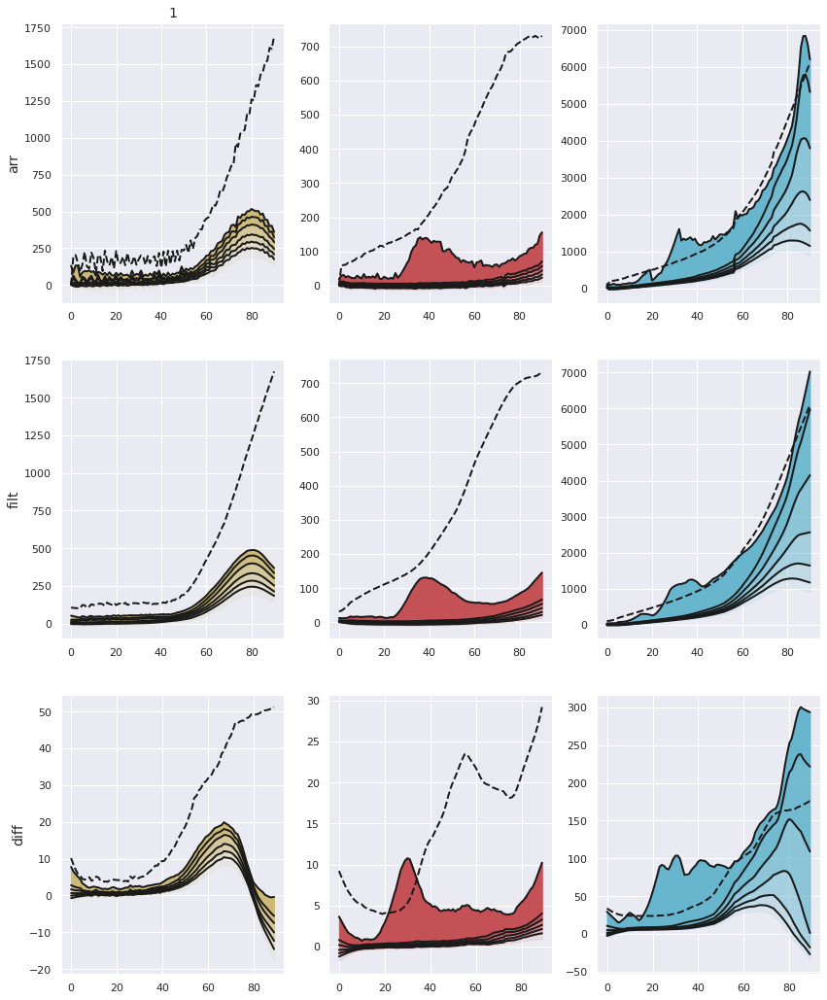

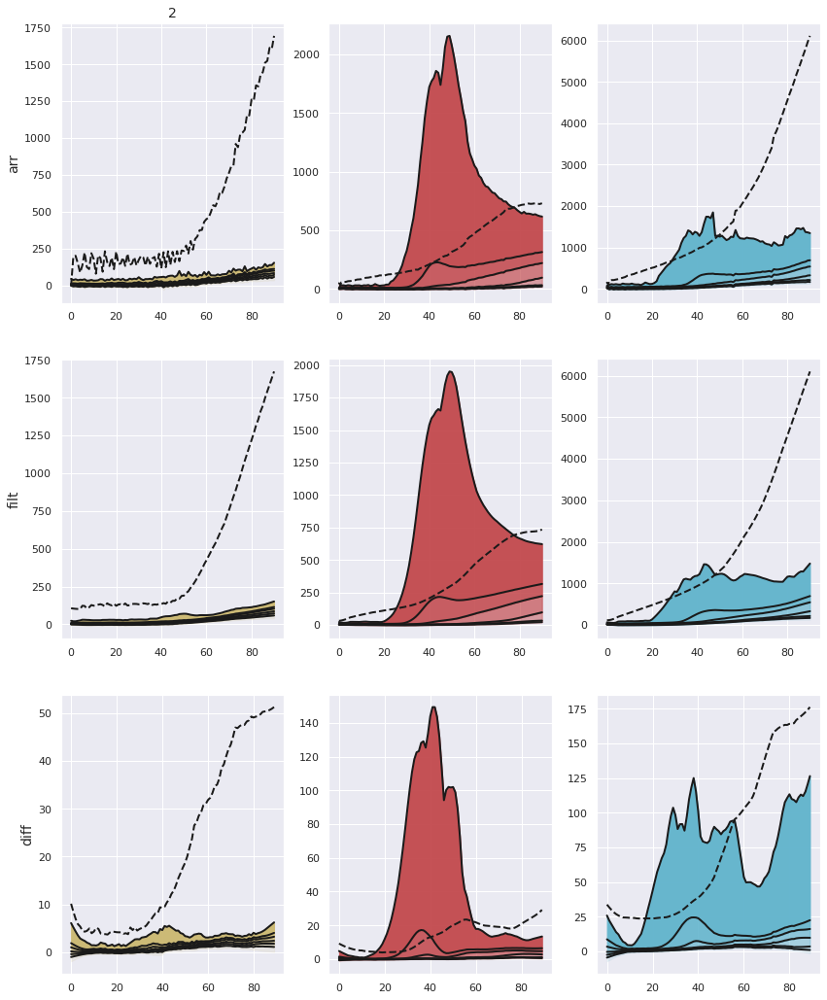

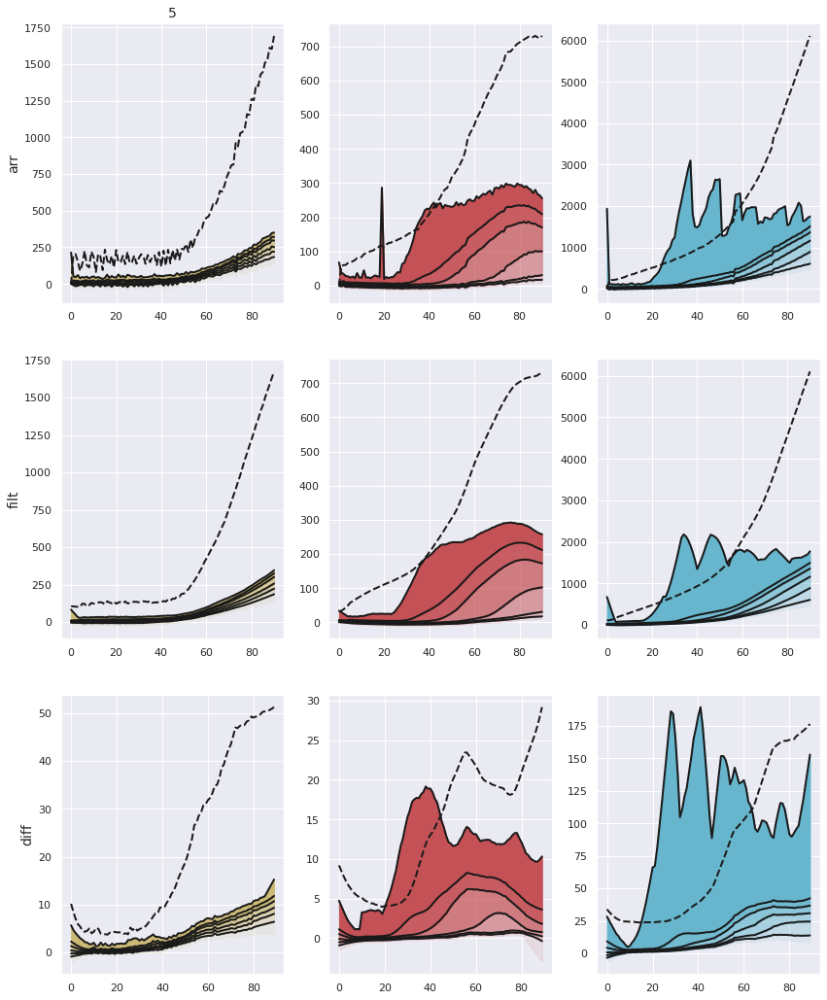

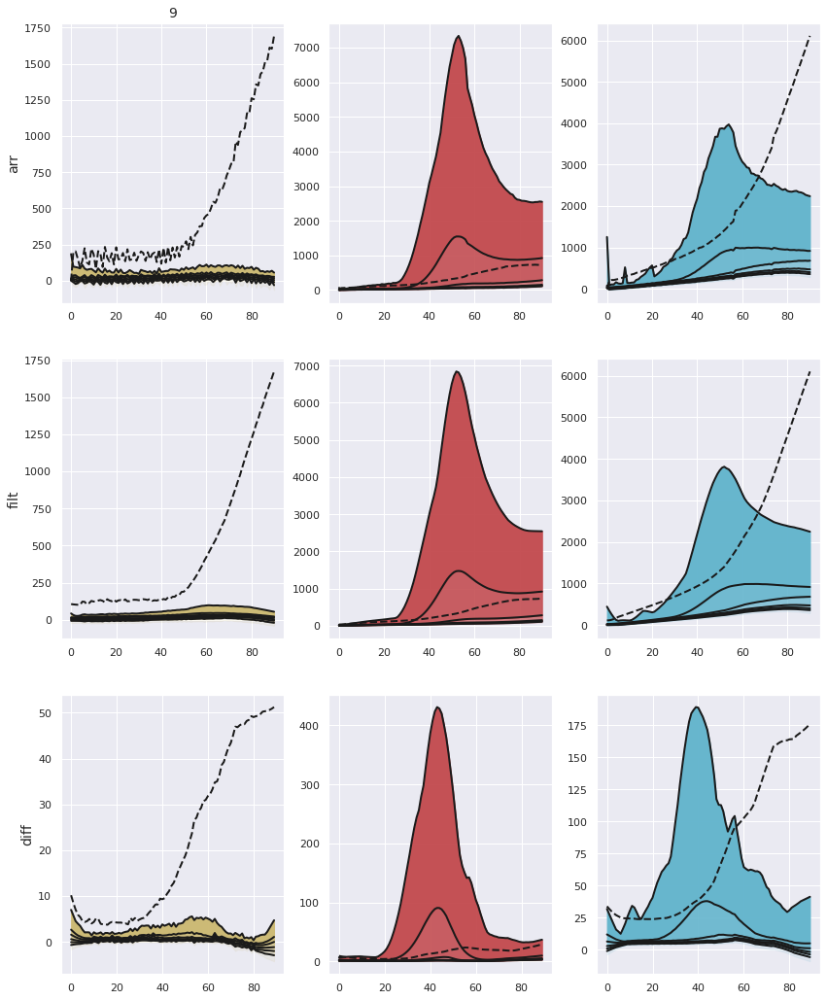

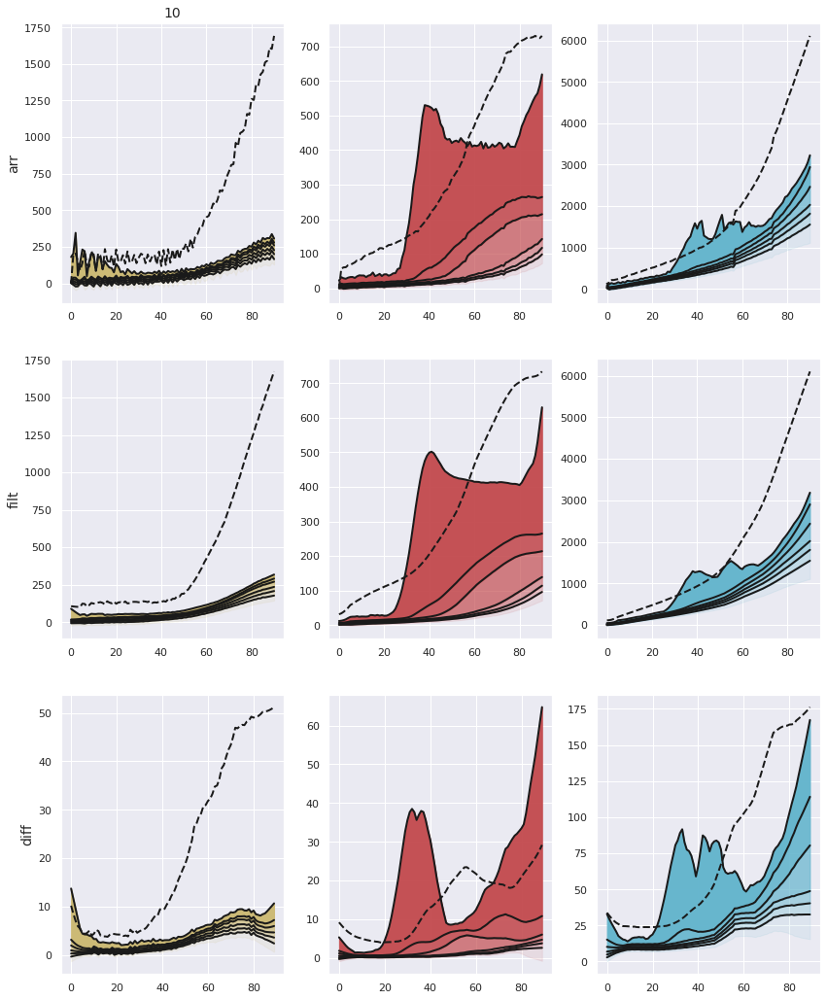

...

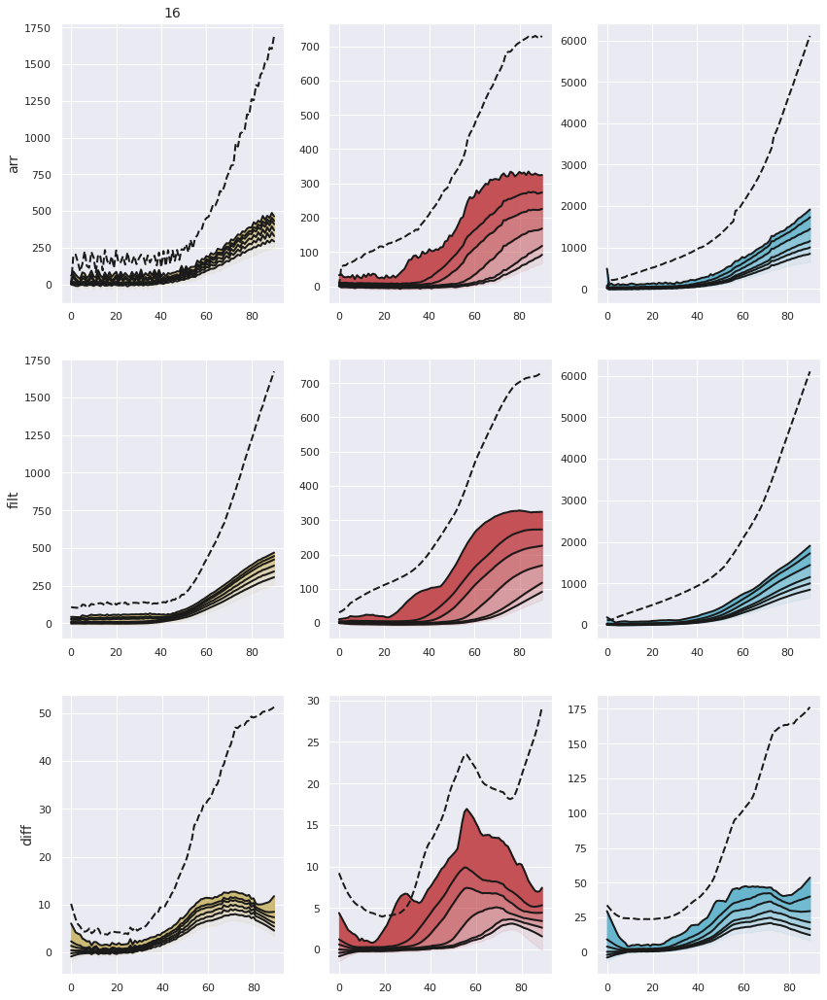

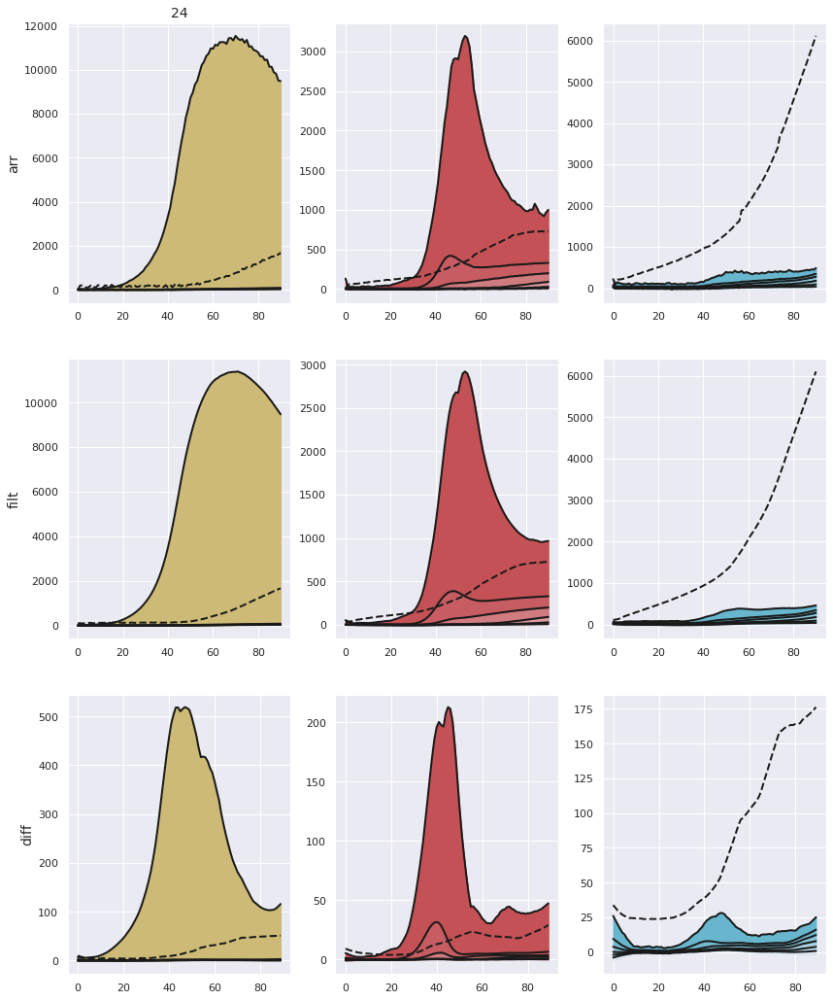

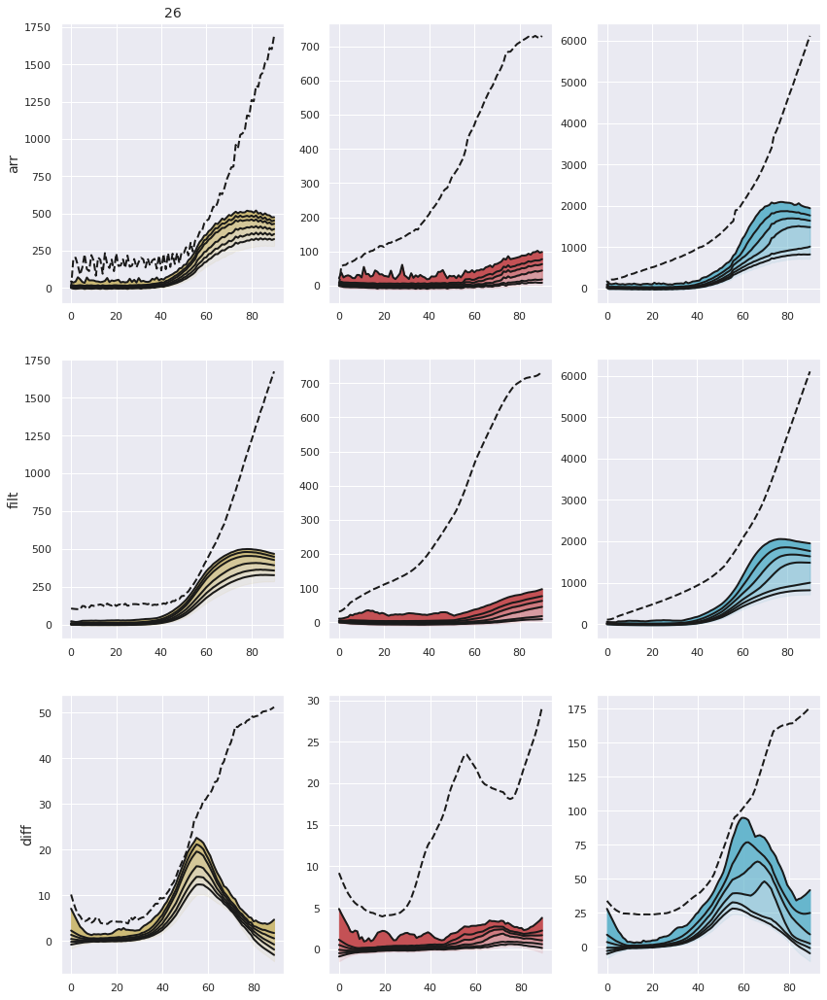

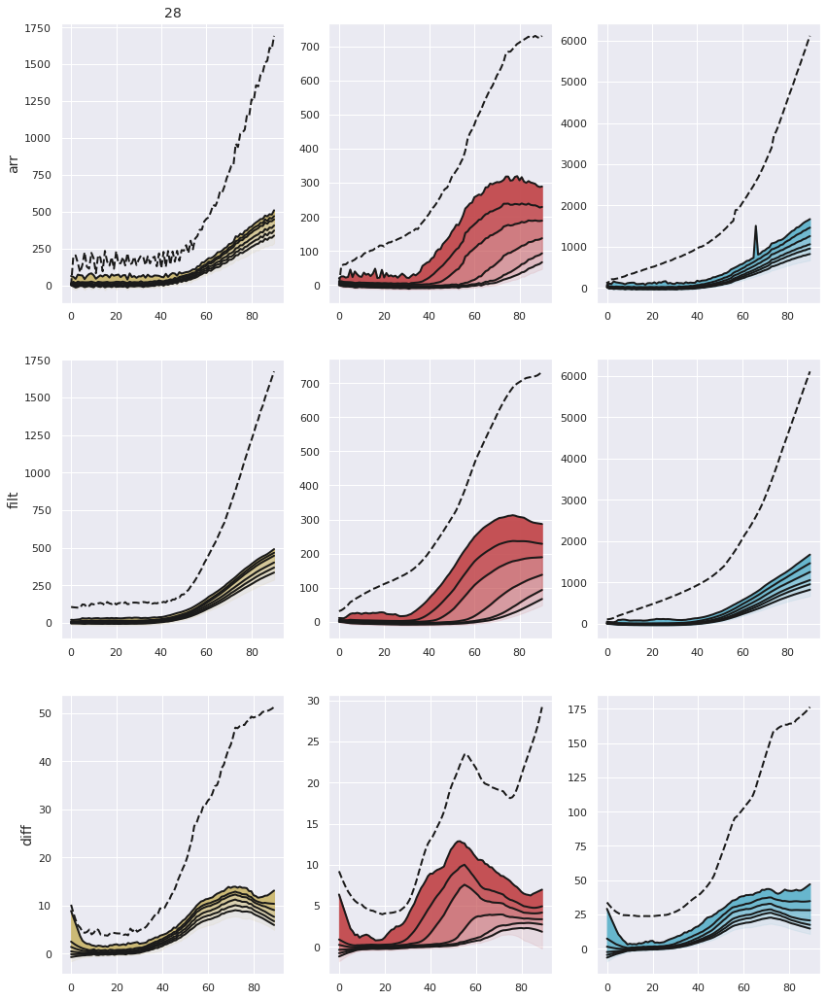

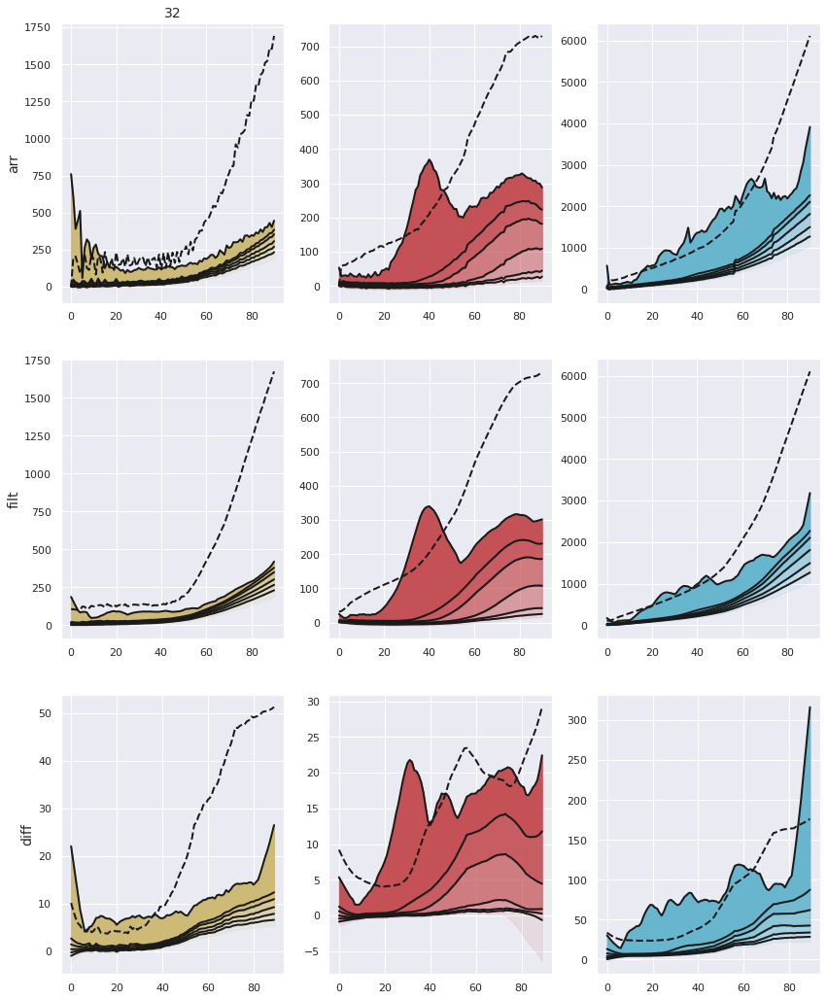

In [307]:

bounds = [0.1,0.3,0.5,0.7,0.9,0.98,1]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
for pad in [1,2,5,9,10,14,15,16,24,26,28,32]:
    proc = mma.ProcessUnorderedDiff(acq, pad, scale=scale, sigma=sigma, 
                                    bg_sigma=bg_sigma, bg_option=bg_option)
    proc._setup(False)
    thresh_df = proc.thresh_df
    im_arr = proc.arr
    im_filt = proc.filt_arr
    im_diff = proc.diff_arr
    fig, axs = plt.subplots(3,3,figsize=(14,18))
    for i_im, arr in enumerate([im_arr, im_filt, im_diff]):
        f_vec = np.arange(arr.shape[0])
        bound_arrs = np.quantile(arr, q=bounds, axis=(2,3))
        for color, ci in zip(mpl_colors, [0,1,2]):
            m_inds = (ylabs[i_im], ci, slice(None))
            thresh_vec = thresh_df.loc[m_inds,'threshold']
            bound_vecs = bound_arrs[:,:,ci]
            ax = axs[i_im, ci]
            for b_i, bound_lims in enumerate(zip(bound_vecs[:-1,:],bound_vecs[1:,:])):
                l_bound = bound_lims[0]
                h_bound = bound_lims[1]
                _ = ax.plot(f_vec, h_bound, c='k')
                b_val = bounds[b_i]
                _ = ax.fill_between(f_vec, l_bound, h_bound, color=color, alpha=b_val)
            _ = ax.plot(f_vec, thresh_vec, '--k')
        axs[i_im,0].set_ylabel(ylabs[i_im])
    axs[0,0].set_title(pad)


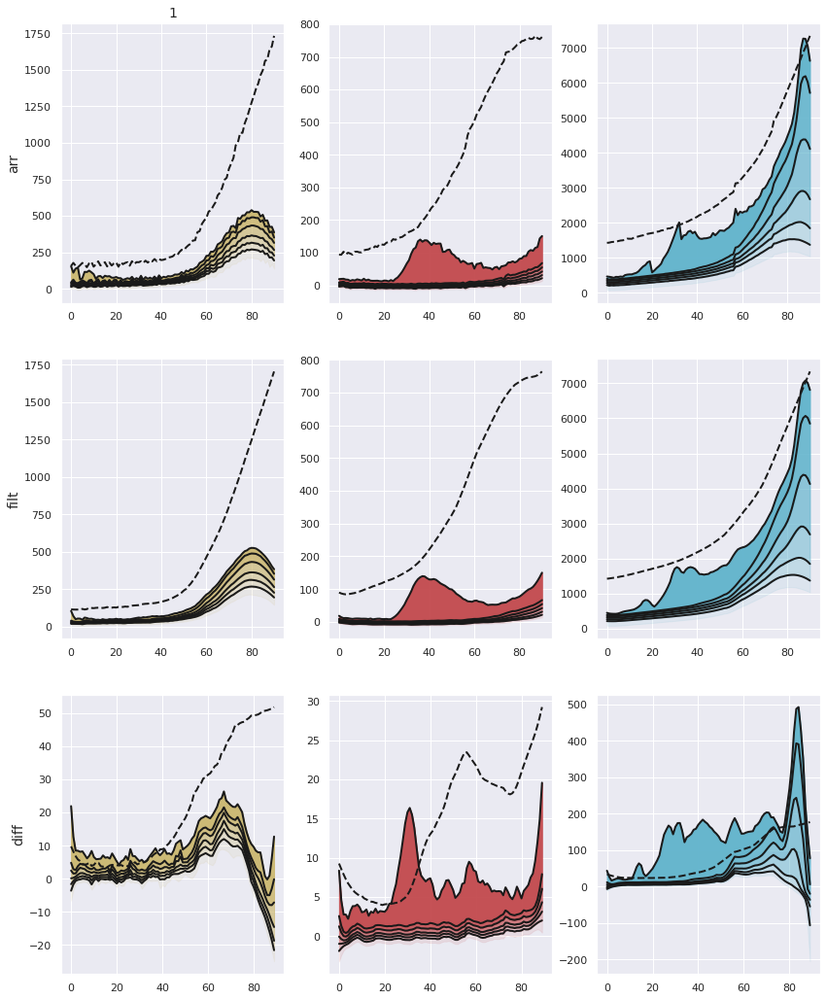

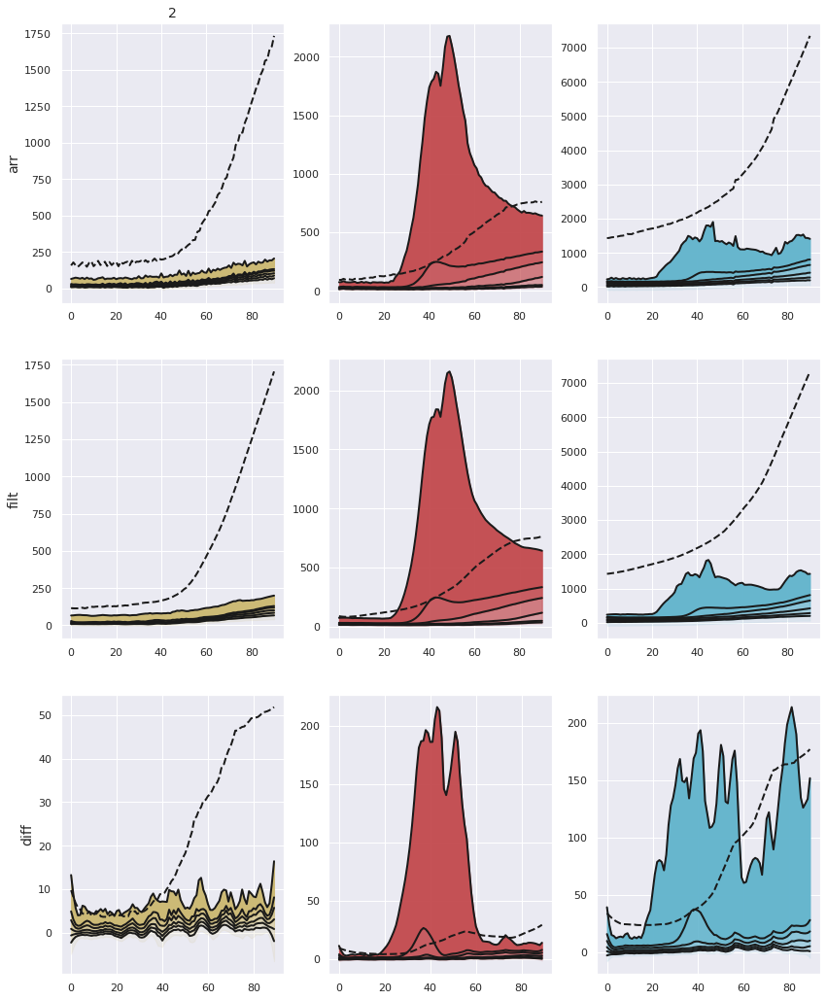

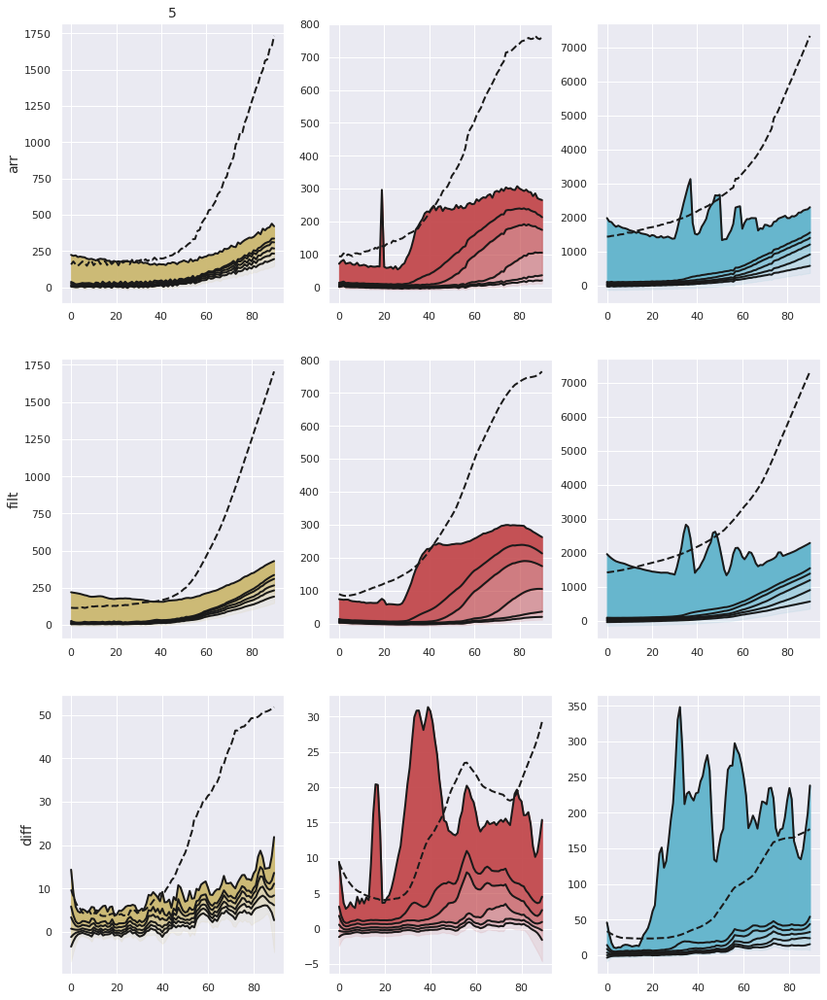

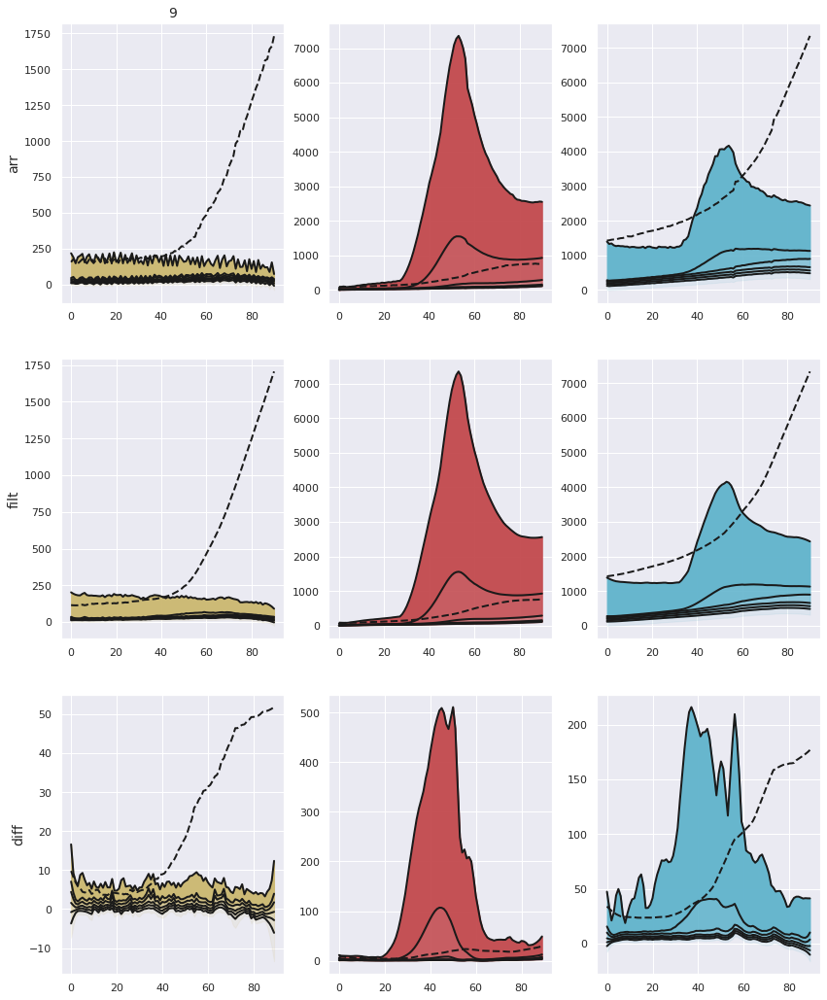

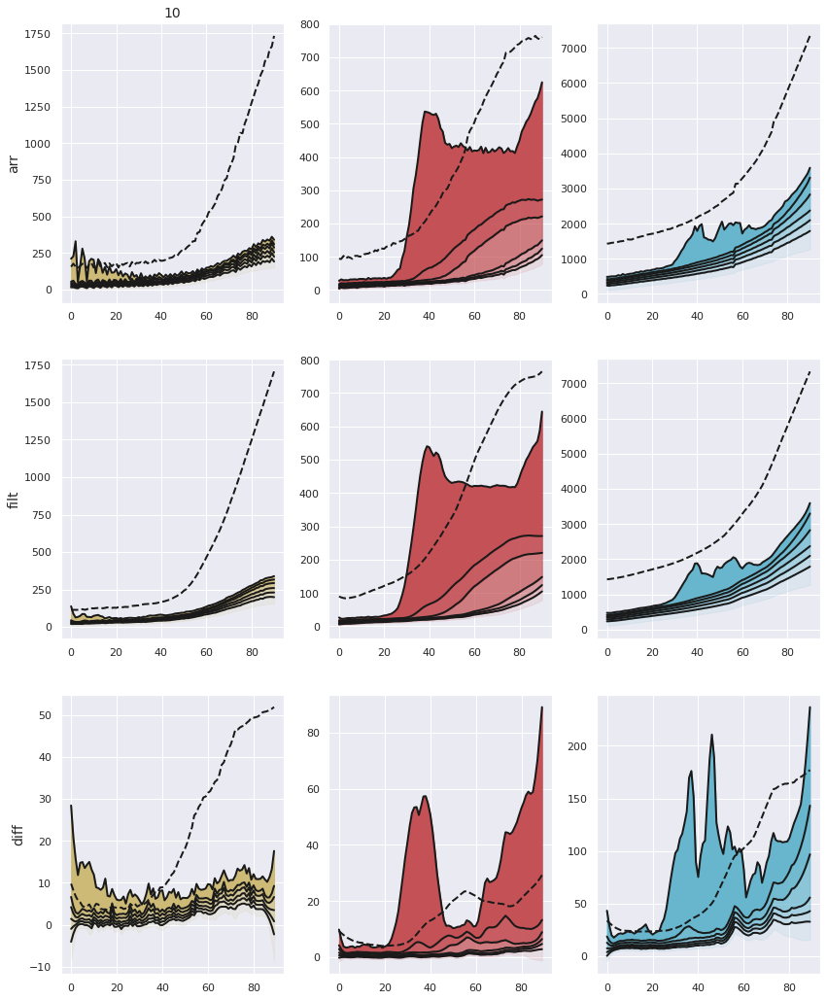

...

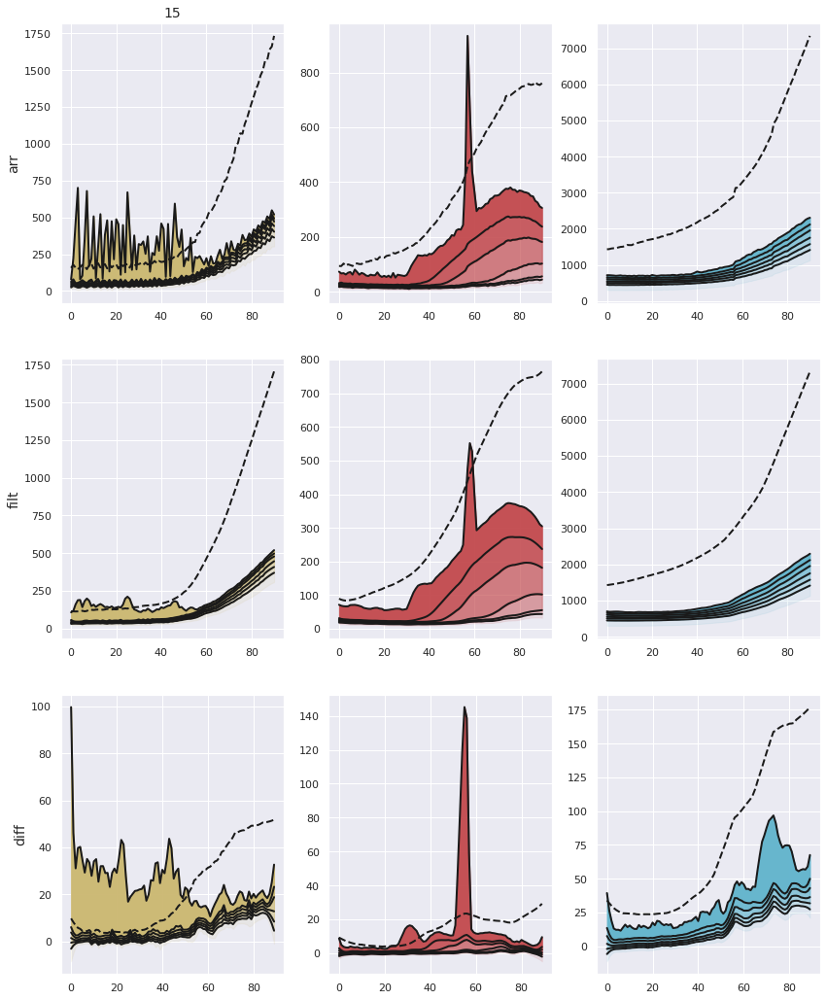

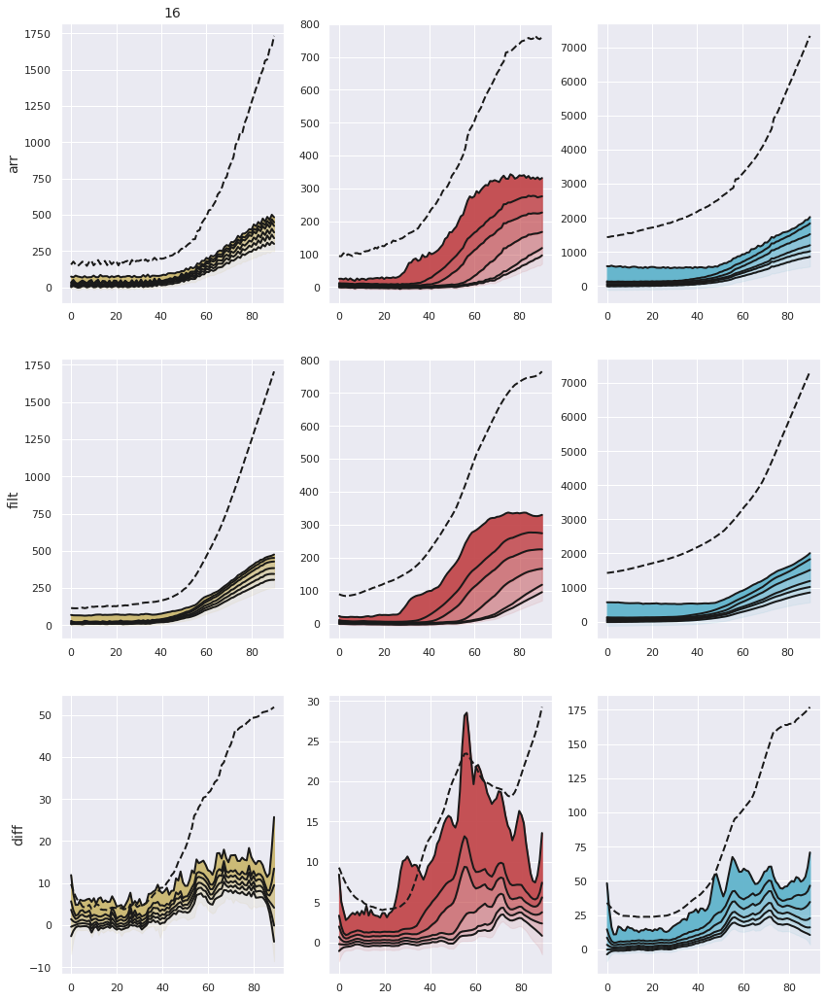

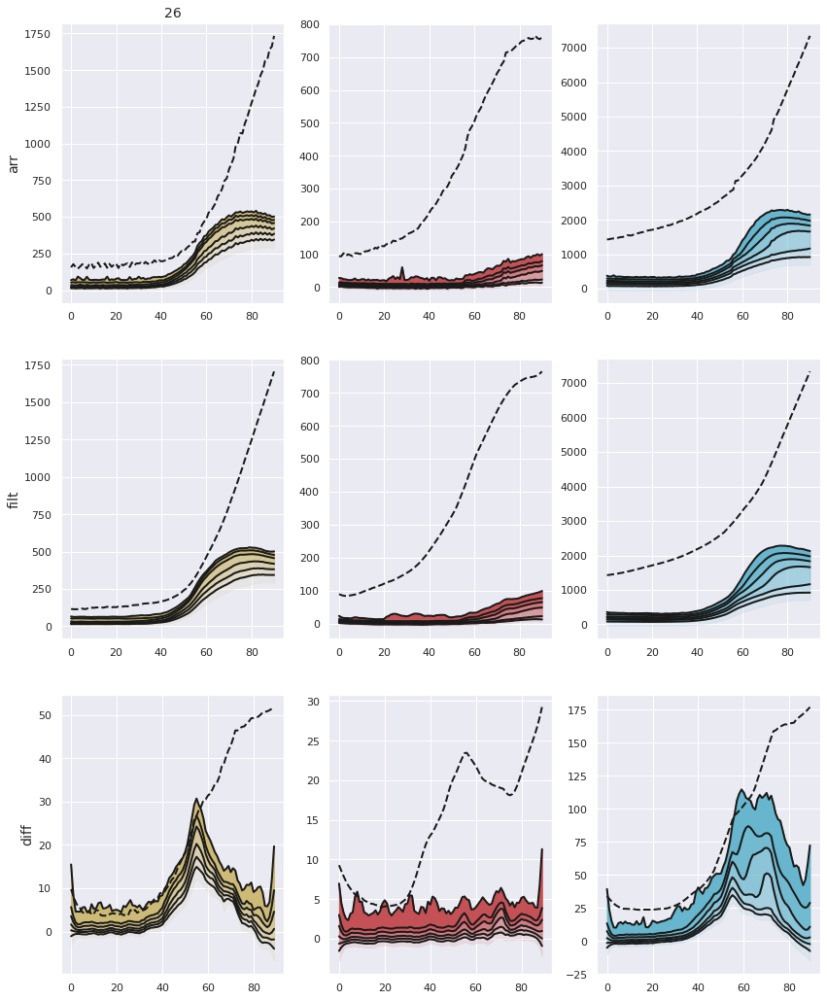

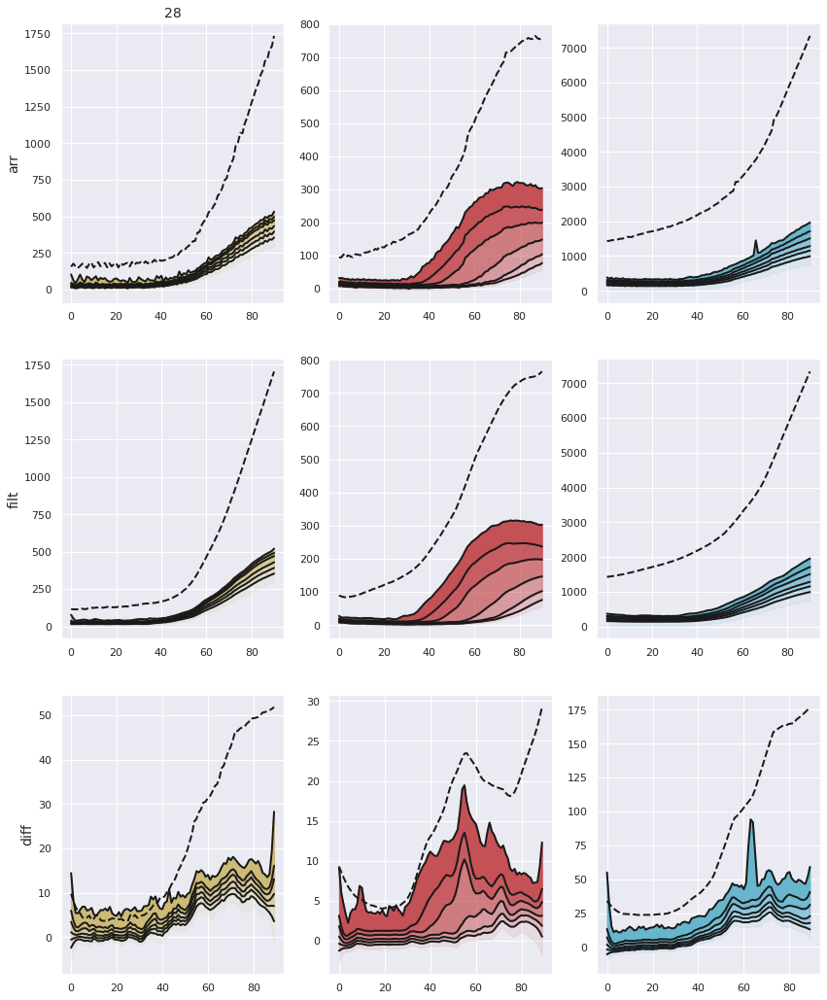

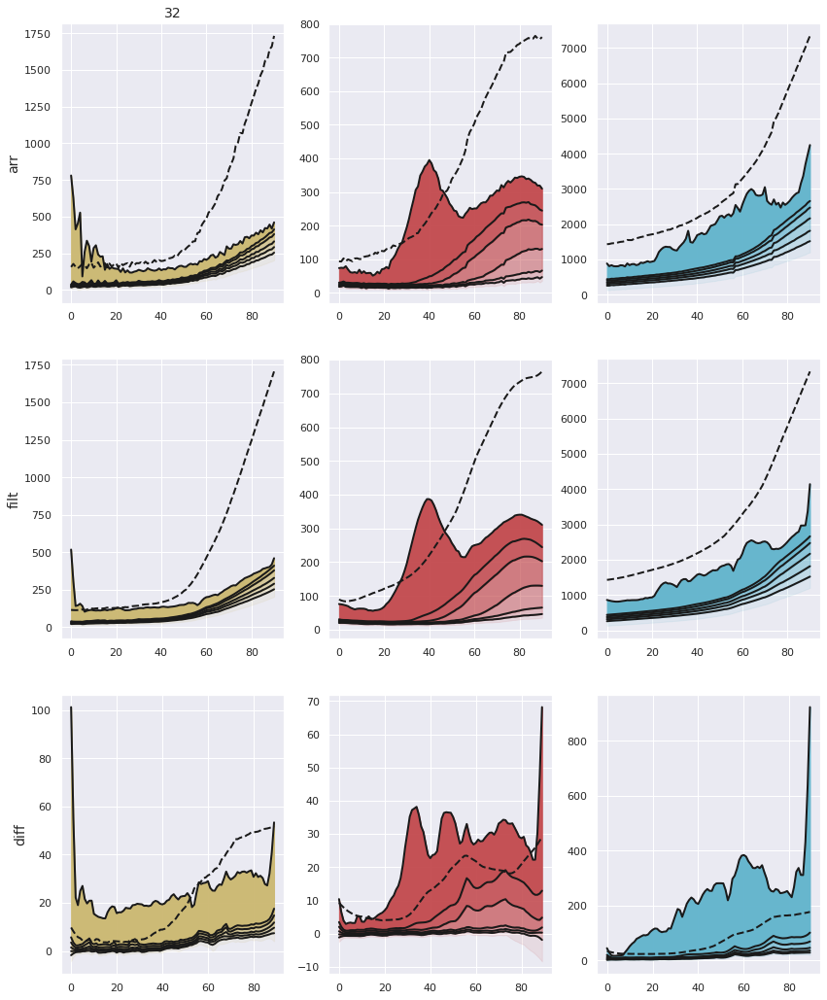

In [22]:

bounds = [0.1,0.3,0.5,0.7,0.9,0.98,1]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
for pad in [1,2,5,9,10,14,15,16,26,28,32]:
    im_arr = skimage.external.tifffile.imread(tiff_fn_tmpl.format(pad)).reshape((91,3,512,512))
    im_filt = signal.savgol_filter(im_arr, 9, 2, axis=0)
    im_diff = np.diff(im_filt, axis=0)
    im_diff = signal.savgol_filter(im_diff, 9, 2, axis=0)
    fig, axs = plt.subplots(3,3,figsize=(14,18))
    for i_im, arr in enumerate([im_arr, im_filt, im_diff]):
#         thresh_vecs = thresh_vecs_list[i_im]
        f_vec = np.arange(arr.shape[0])
        bound_arrs = np.quantile(arr, q=bounds, axis=(2,3))
        for color, ci in zip(mpl_colors, [0,1,2]):
#             thresh_vec = thresh_vecs[ci]
            m_inds = (ylabs[i_im], ci, slice(None))
            thresh_vec = thresh_df.loc[m_inds,'threshold']
            bound_vecs = bound_arrs[:,:,ci]
            ax = axs[i_im, ci]
            for b_i, bound_lims in enumerate(zip(bound_vecs[:-1,:],bound_vecs[1:,:])):
                l_bound = bound_lims[0]
                h_bound = bound_lims[1]
                _ = ax.plot(f_vec, h_bound, c='k')
                b_val = bounds[b_i]
                _ = ax.fill_between(f_vec, l_bound, h_bound, color=color, alpha=b_val)
            _ = ax.plot(f_vec, thresh_vec, '--k')
        axs[i_im,0].set_ylabel(ylabs[i_im])
    axs[0,0].set_title(pad)


#### High fluorescence pads

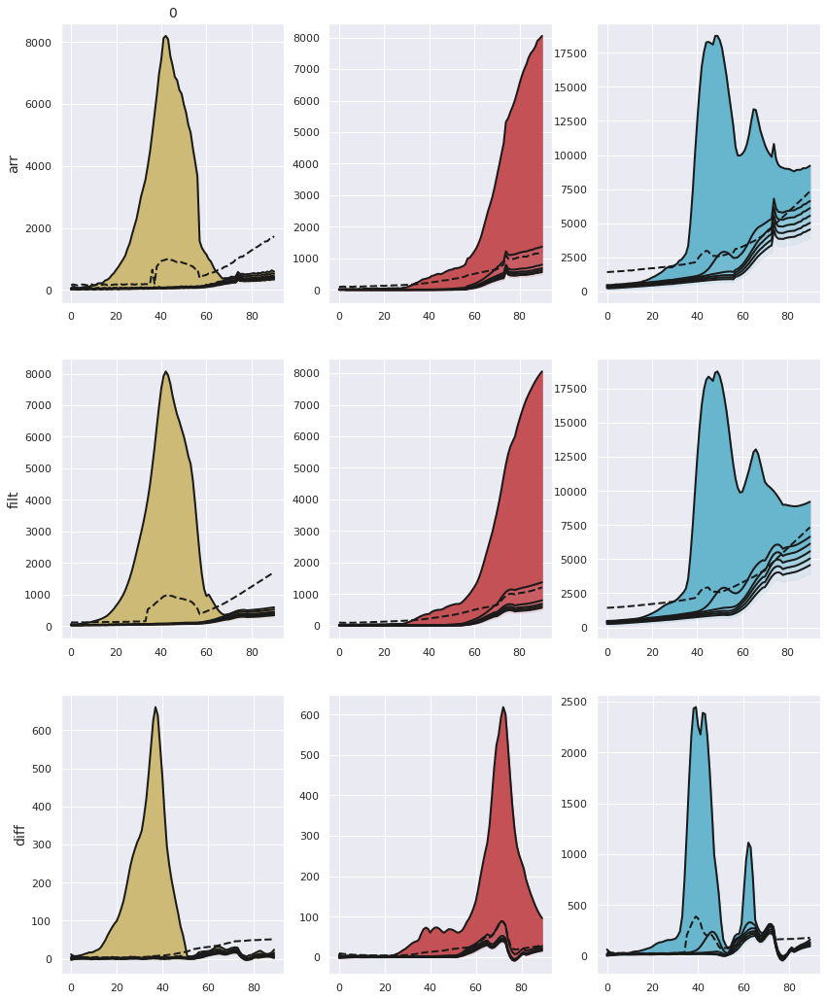

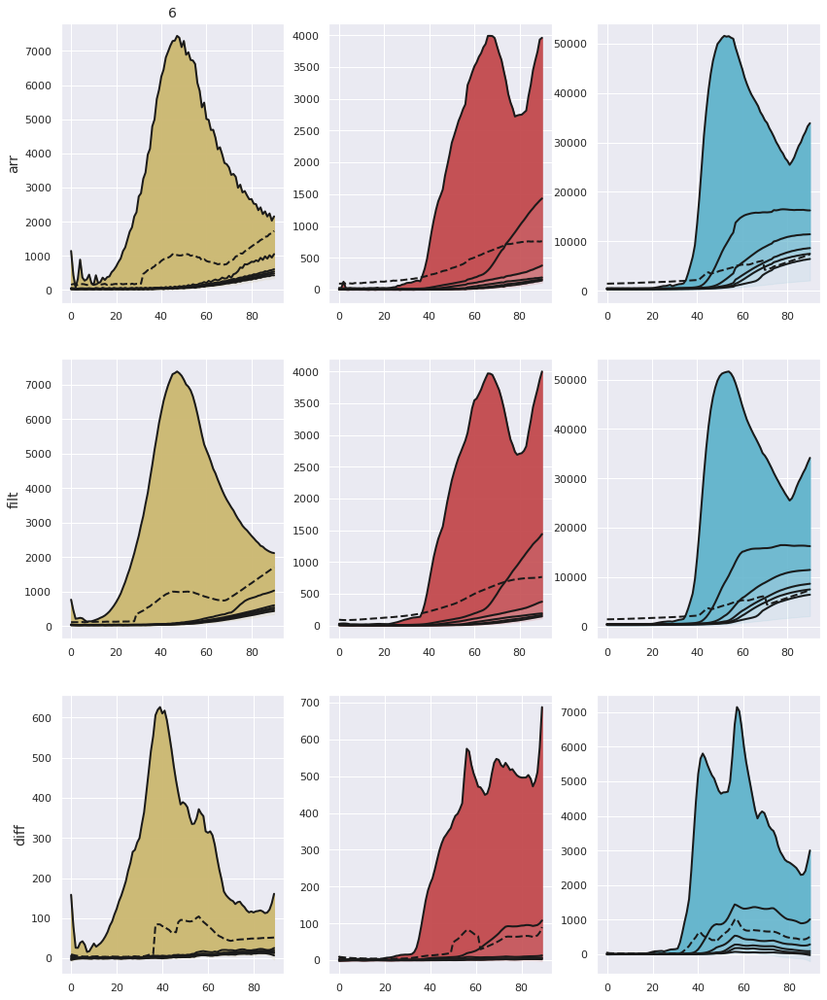

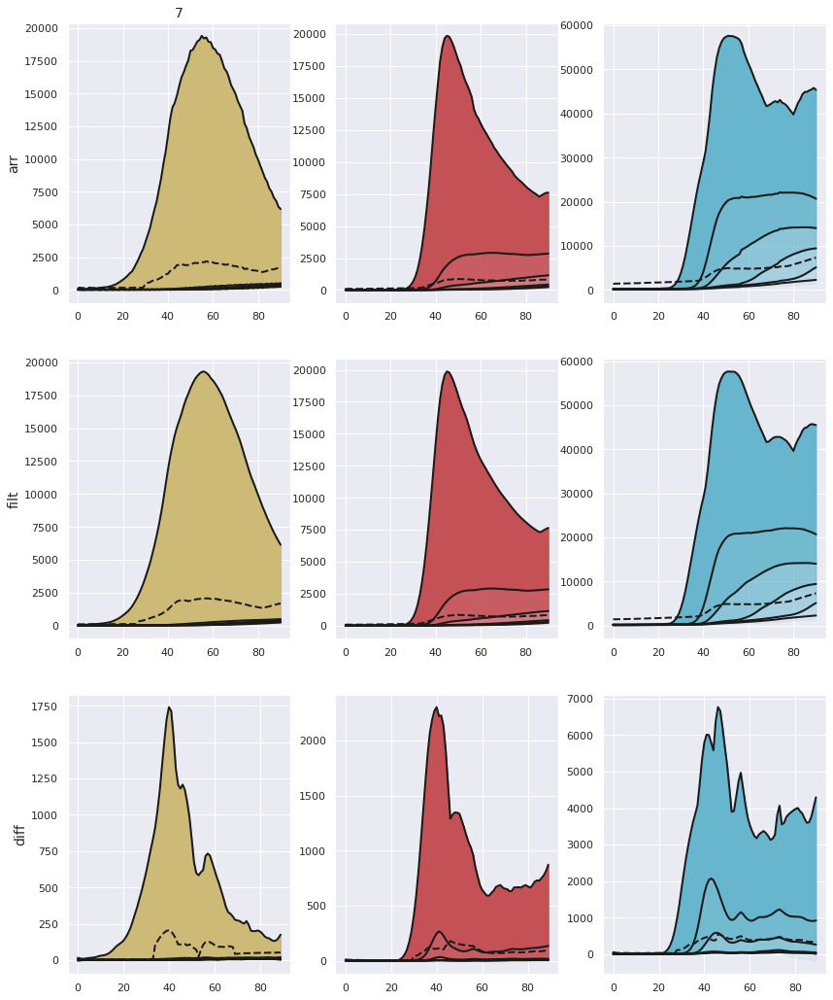

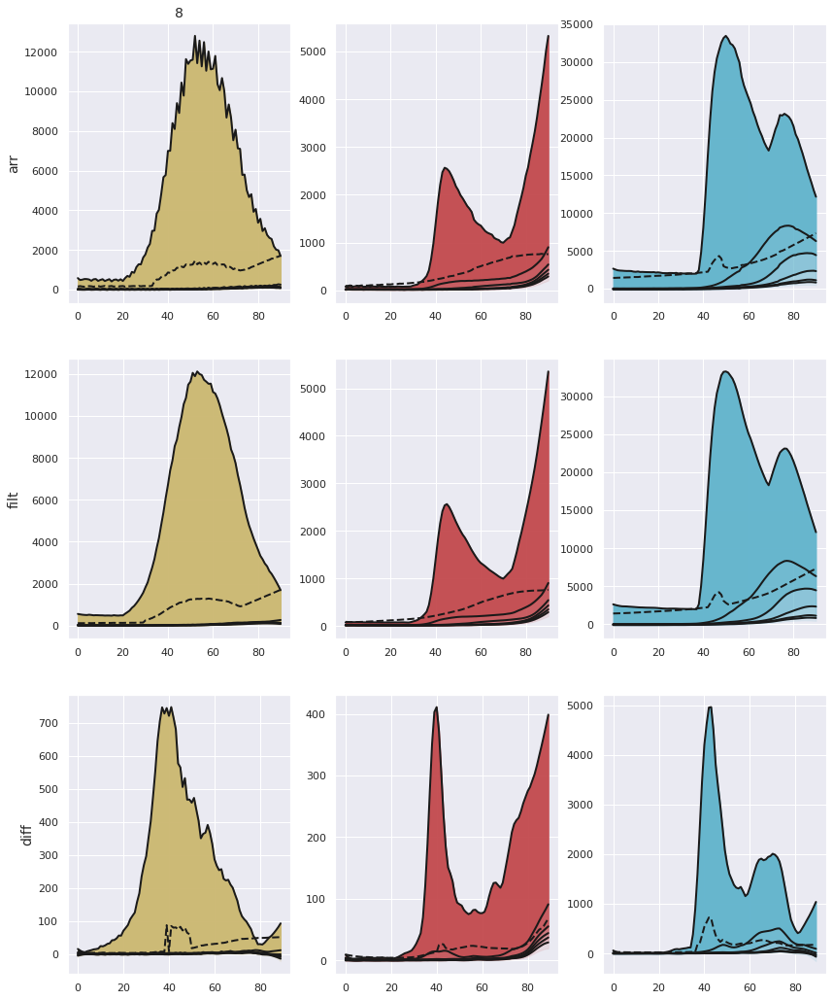

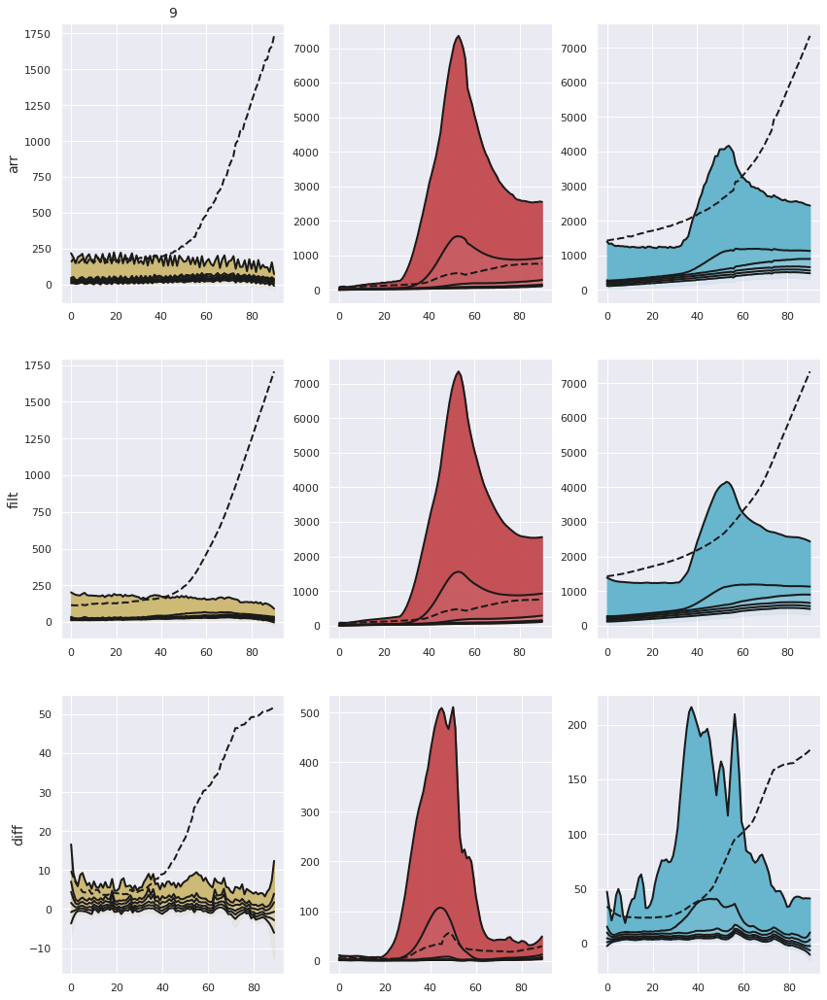

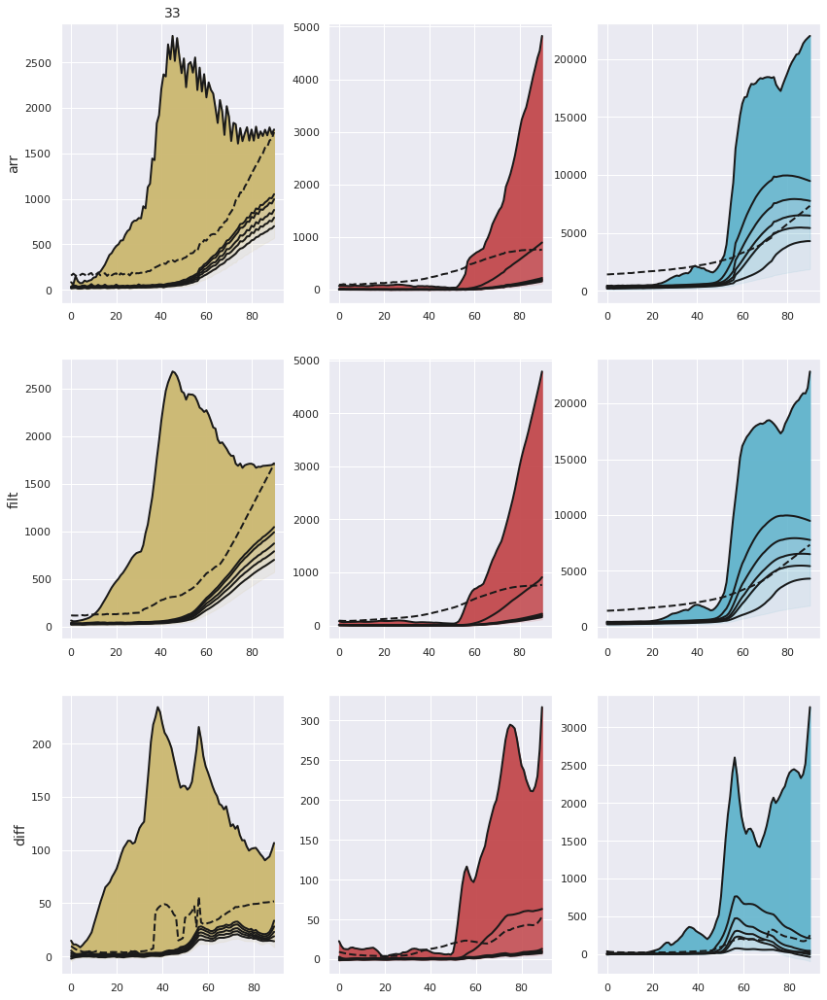

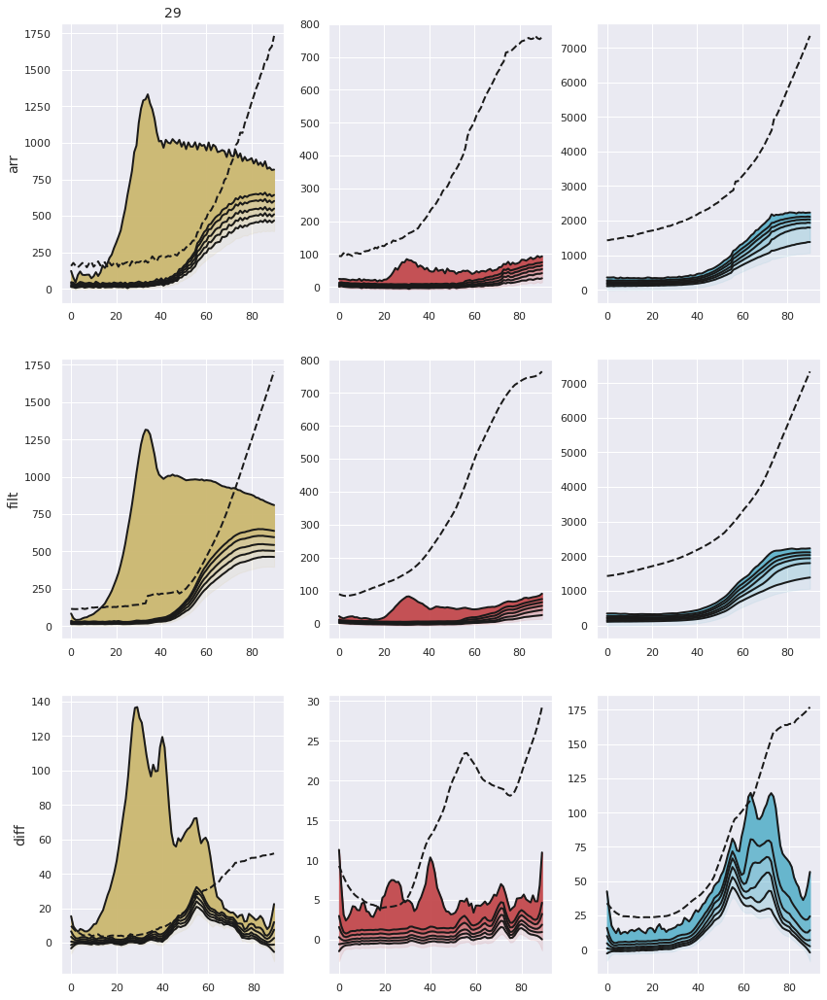

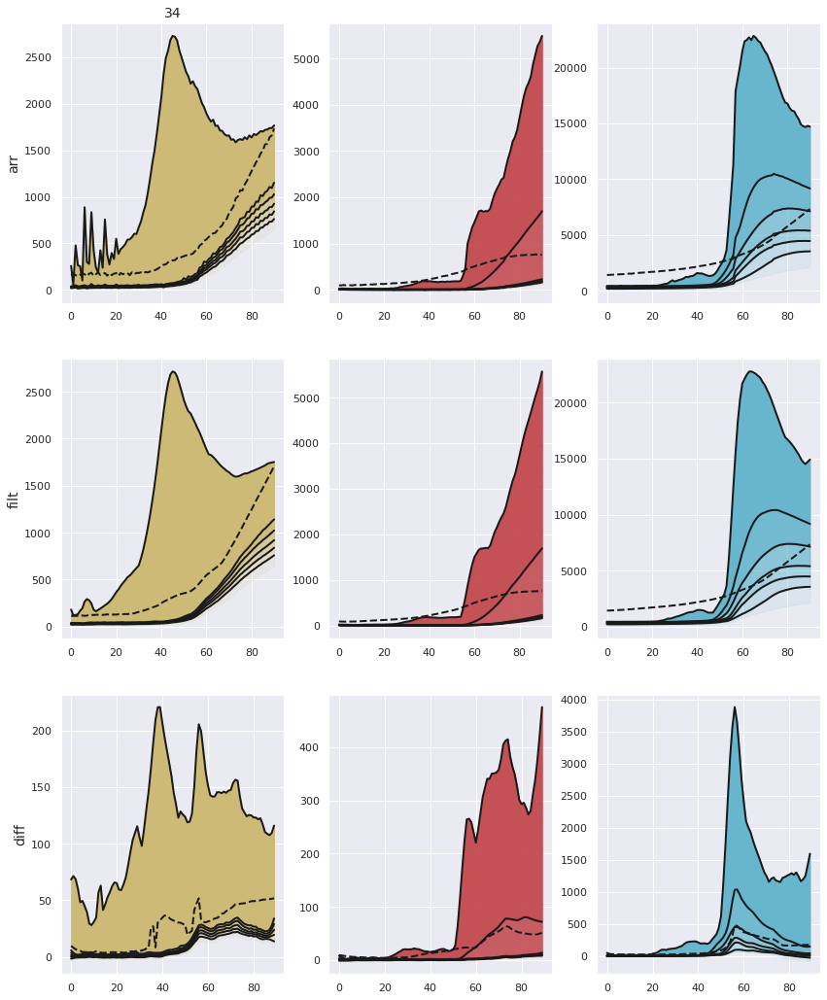

In [23]:
def thresh_helper(arr):
    initial_guess = np.quantile(arr, 0.97)
    thresh = skimage.filters.threshold_li(arr, tolerance=5, initial_guess=initial_guess)
    return thresh
bounds = [0.1,0.3,0.5,0.7,0.9,0.98,1]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
for pad in [0,6,7,8,9,33,29,34]:
    im_arr = skimage.external.tifffile.imread(tiff_fn_tmpl.format(pad)).reshape((91,3,512,512))
    im_filt = signal.savgol_filter(im_arr, 9, 2, axis=0)
    im_diff = np.diff(im_filt, axis=0)
    im_diff = signal.savgol_filter(im_diff, 9, 2, axis=0)
    fig, axs = plt.subplots(3,3,figsize=(14,18))
    for i_im, arr in enumerate([im_arr, im_filt, im_diff]):
#         thresh_vecs = thresh_vecs_list[i_im]
        f_vec = np.arange(arr.shape[0])
        bound_arrs = np.quantile(arr, q=bounds, axis=(2,3))
        for color, ci in zip(mpl_colors, [0,1,2]):
#             thresh_vec = thresh_vecs[ci]
            m_inds = (ylabs[i_im], ci, slice(None))
            thresh_mins = thresh_df.loc[m_inds,'threshold']
            thresh_vec = [np.max((thresh_helper(arr[f,ci,:,:]),thresh_mins[f])) for f in f_vec]
            bound_vecs = bound_arrs[:,:,ci]
            ax = axs[i_im, ci]
            for b_i, bound_lims in enumerate(zip(bound_vecs[:-1,:],bound_vecs[1:,:])):
                l_bound = bound_lims[0]
                h_bound = bound_lims[1]
                _ = ax.plot(f_vec, h_bound, c='k')
                b_val = bounds[b_i]
                _ = ax.fill_between(f_vec, l_bound, h_bound, color=color, alpha=b_val)
            _ = ax.plot(f_vec, thresh_vec, '--k')
        axs[i_im,0].set_ylabel(ylabs[i_im])
    axs[0,0].set_title(pad)


#### algorithmic thresholding on high pads for comparison

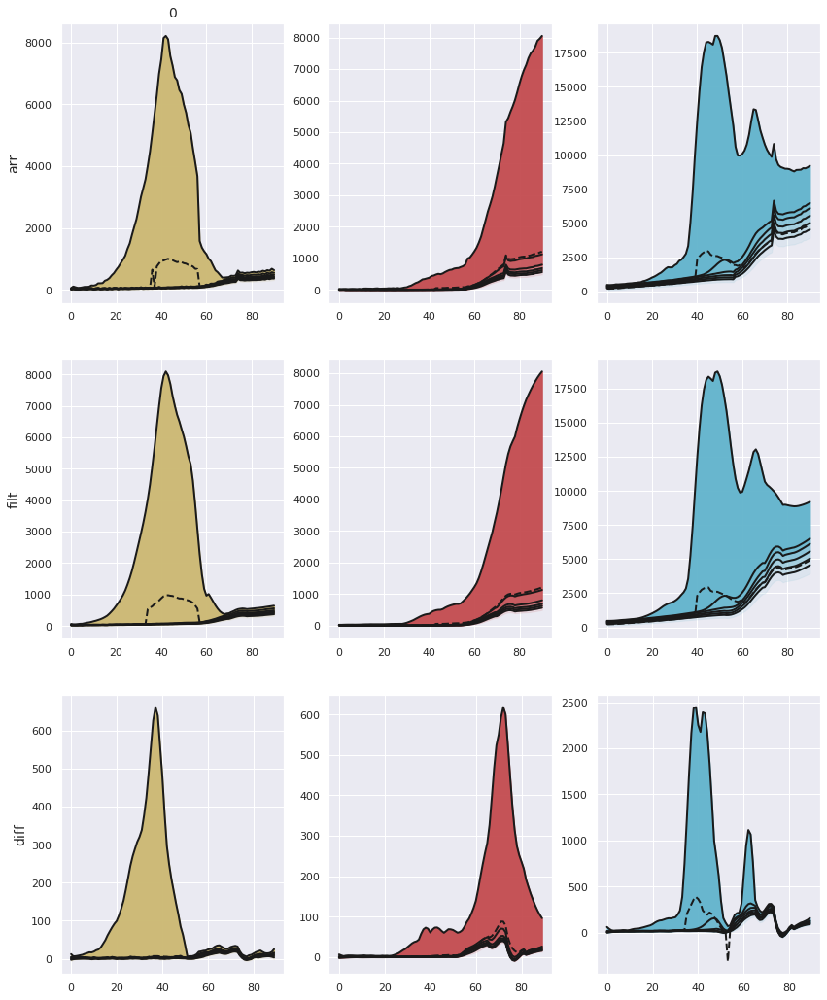

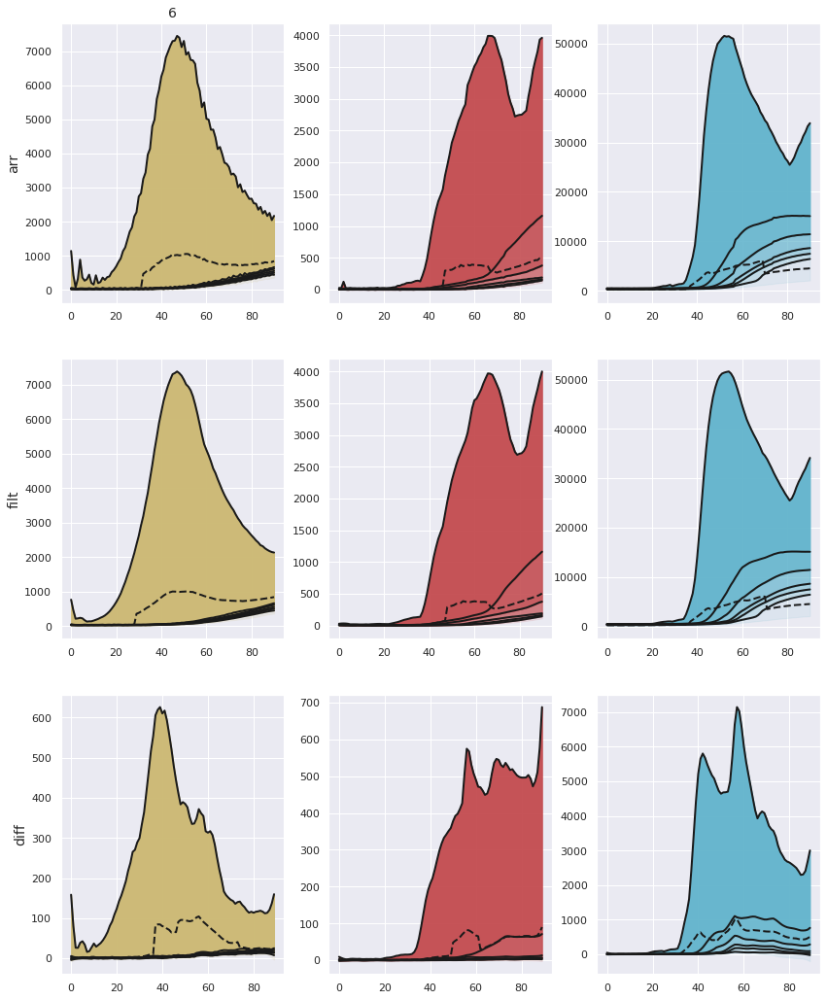

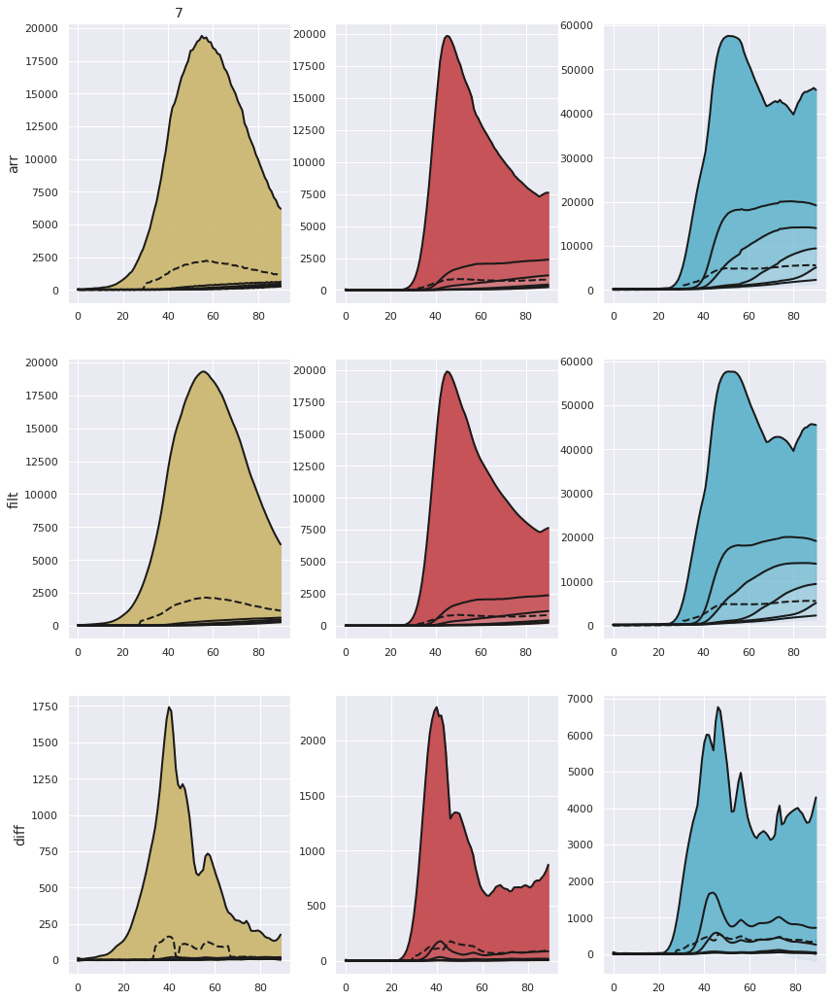

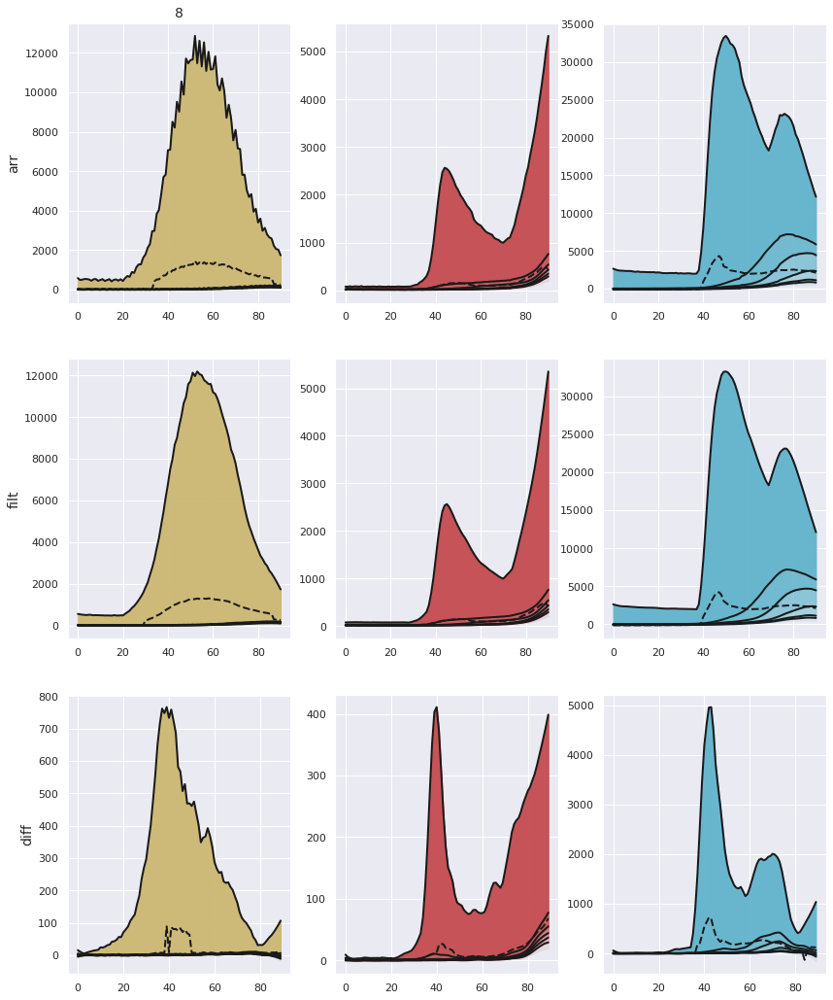

In [190]:
def thresh_helper(arr):
    initial_guess = np.quantile(arr, 0.97)
    thresh = skimage.filters.threshold_li(arr, tolerance=5, initial_guess=initial_guess)
    return thresh
bounds = [0.1,0.3,0.5,0.7,0.9,0.97,1]
mpl_colors = np.array(mma.mpl_named_colors)[acq.chan_ind_list]
ylabs = ['arr', 'filt', 'diff']
for pad in [0,6,7,8]:
    im_arr = skimage.external.tifffile.imread(tiff_fn_tmpl.format(pad)).reshape((91,3,512,512))
    im_filt = signal.savgol_filter(im_arr, 9, 2, axis=0)
    im_diff = np.diff(im_filt, axis=0)
    im_diff = signal.savgol_filter(im_diff, 9, 2, axis=0)
    fig, axs = plt.subplots(3,3,figsize=(14,18))
    for i_im, arr in enumerate([im_arr, im_filt, im_diff]):
        thresh_vecs = thresh_vecs_list[i_im]
        f_vec = np.arange(arr.shape[0])
        bound_arrs = np.quantile(arr, q=bounds, axis=(2,3))
        for color, ci in zip(mpl_colors, [0,1,2]):
#             thresh_vec = thresh_vecs[ci]
            thresh_vec = [thresh_helper(arr[f,ci,:,:]) for f in f_vec]
            bound_vecs = bound_arrs[:,:,ci]
            ax = axs[i_im, ci]
            for b_i, bound_lims in enumerate(zip(bound_vecs[:-1,:],bound_vecs[1:,:])):
                l_bound = bound_lims[0]
                h_bound = bound_lims[1]
                _ = ax.plot(f_vec, h_bound, c='k')
                b_val = bounds[b_i]
                _ = ax.fill_between(f_vec, l_bound, h_bound, color=color, alpha=b_val)
            _ = ax.plot(f_vec, thresh_vec, '--k')
        axs[i_im,0].set_ylabel(ylabs[i_im])
    axs[0,0].set_title(pad)


## Testing out derivative thresholding

In [37]:
fn = '/central/scratchio/jparkin/tiffstacks/200626_finalday/img_1/pad0.tiff'
tfile = skimage.external.tifffile.TiffFile(fn)
metadata_str = tfile.info()
split_list = metadata_str.split('\n')
imj_flag = False
imagej_lines = []
for line in split_list:
    if imj_flag:
        key, val = line.split(':')
        imagej_lines.append((key[2:],val[1:]))
    if '* ImageJ' in line:
        imj_flag = True
dict(imagej_lines)

{'bg_option': 'pos_list',
 'bg_sigma': '64',
 'channels': '273',
 'hyperstack': 'True',
 'images': '273',
 'mode': 'grayscale',
 'scale': '1',
 'sigma': '2'}

In [18]:
mma = importlib.reload(mma)

In [20]:
pad_ind = 9
procdiff = mma.ProcessUnorderedDiff(acq, pad_ind, scale=1, sigma=2, bg_sigma=64, 
                                    print_img=True, bg_option='pos_list',diff=True)
plt.close('all')

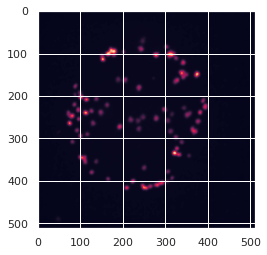

In [21]:
im = procdiff.arr[45,1,:,:]
plt.imshow(im)

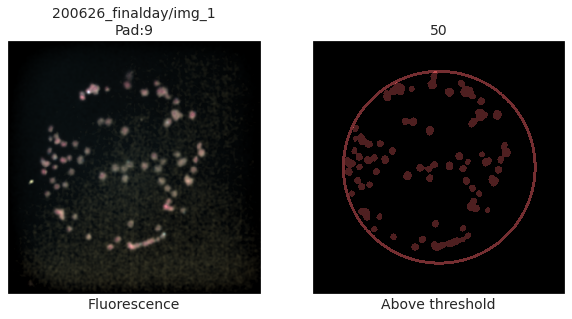

In [22]:
procdiff.printer._setup_figure()
procdiff.printer.animate(50)
# plt.

In [ ]:
procdiff.printer._setup_figure()
# anim = procdiff.printer.get_animation()
fig = procdiff.printer.fig
# func = procdiff.printer.animate
def func(frame, proc=procdiff):
    procdiff.process_frame(frame)
frames = acq.frame_vec
anim = mma.anm.FuncAnimation(fig, func, interval=70, frames=frames[:-1])
HTML(anim.to_html5_video())

### Correcting for rfp activation in yfp excitation

In [118]:
mma = importlib.reload(mma)
pad_ind = 20
procdiff = mma.ProcessUnorderedDiff(acq, pad_ind, scale=1, sigma=2, bg_sigma=64, 
                                    print_img=False, bg_option='pos_list',diff=True)

In [80]:
csv_fn = os.path.join(acq.super_dir,'csvs','pad{}.csv'.format(pad_ind))
pad_df = pd.read_csv(csv_fn)
thresh_dict = pad_df[['frame','channel','thresh']].groupby(['frame','channel']).agg(np.min)

In [75]:
np.ndarray?

In [92]:
nf, nc, nh, nw = procdiff.diff_arr.shape
areas = np.zeros(50)
# rfp_fluors = []
# yfp_fluors = []
# frames = []
data = []
for f_i in np.arange(60):
    yfp_arr = procdiff.arr[f_i,0,:,:]
    rfp_arr = procdiff.arr[f_i,1,:,:]
    cfp_arr = procdiff.arr[f_i,2,:,:]
    key = (np.float(f_i), 3.0)
    if key in thresh_dict.index:
        thresh = thresh_dict.loc[key,'thresh']
        bw_im = rfp_arr >= thresh
        if np.sum(bw_im)>4:
            masks = skimage.measure.label(bw_im)
            rprops = skimage.measure.regionprops(masks)
            for rp in rprops:
                area, label = rp.area, rp.label
                mask_im = masks == label
                rfp_fluors = rfp_arr[mask_im]
                yfp_fluors = yfp_arr[mask_im]
                frame_vec = np.ones(area)*f_i
                new_data = np.array([rfp_fluors, yfp_fluors, frame_vec]).T
                data.append(new_data)
    else:
        print('skipped',key)
data = np.concatenate(data,axis=0)

skipped (0.0, 3.0)
skipped (1.0, 3.0)
skipped (2.0, 3.0)
skipped (3.0, 3.0)
skipped (4.0, 3.0)
skipped (5.0, 3.0)
skipped (6.0, 3.0)
skipped (7.0, 3.0)
skipped (8.0, 3.0)
skipped (9.0, 3.0)
skipped (10.0, 3.0)
skipped (11.0, 3.0)
skipped (12.0, 3.0)
skipped (14.0, 3.0)


[ 0.05850016 55.03760116]


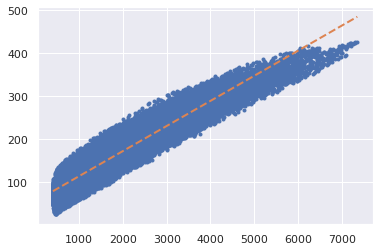

In [114]:
# Rfp to yfp-channel error
fluor_df = pd.DataFrame(data, columns=['rfp','yfp','frame'])
plot_df = fluor_df.loc[fluor_df.frame>45,:]
x, y = plot_df[['rfp','yfp']].values.T
pfit = np.polyfit(x,y,1)
a, b = pfit
print(pfit)
_ = plt.plot(plot_df.rfp, plot_df.yfp,'.')
x_sim = np.linspace(x.min(),x.max(),10)
y_sim = a*x_sim + b
_ = plt.plot(x_sim, y_sim, '--')


In [119]:
nf, nc, nh, nw = procdiff.diff_arr.shape
# areas = np.zeros(50)
# rfp_fluors = []
# yfp_fluors = []
# frames = []
data = []
for f_i in np.arange(60):
    yfp_arr = procdiff.arr[f_i,0,:,:]
    rfp_arr = procdiff.arr[f_i,1,:,:]
    cfp_arr = procdiff.arr[f_i,2,:,:]
    key = (np.float(f_i), 2.0)
    if key in thresh_dict.index:
        thresh = thresh_dict.loc[key,'thresh']
        bw_im = yfp_arr >= thresh
        if np.sum(bw_im)>4:
            masks = skimage.measure.label(bw_im)
            rprops = skimage.measure.regionprops(masks)
            for rp in rprops:
                area, label = rp.area, rp.label
                mask_im = masks == label
                rfp_fluors = rfp_arr[mask_im]
                yfp_fluors = yfp_arr[mask_im]
                cfp_fluors = cfp_arr[mask_im]
                frame_vec = np.ones(area)*f_i
                new_data = np.array([yfp_fluors, rfp_fluors, cfp_fluors, frame_vec]).T
                data.append(new_data)
    else:
        print('skipped',key)
data = np.concatenate(data,axis=0)
fluor_df = pd.DataFrame(data, columns=['yfp','rfp','cfp','frame'])

skipped (0.0, 2.0)
skipped (1.0, 2.0)
skipped (2.0, 2.0)
skipped (3.0, 2.0)
skipped (4.0, 2.0)
skipped (5.0, 2.0)
skipped (6.0, 2.0)
skipped (7.0, 2.0)
skipped (8.0, 2.0)
skipped (9.0, 2.0)
skipped (10.0, 2.0)
skipped (11.0, 2.0)
skipped (12.0, 2.0)
skipped (13.0, 2.0)
skipped (14.0, 2.0)
skipped (15.0, 2.0)
skipped (16.0, 2.0)
skipped (17.0, 2.0)
skipped (18.0, 2.0)
skipped (19.0, 2.0)
skipped (20.0, 2.0)
skipped (21.0, 2.0)
skipped (22.0, 2.0)
skipped (23.0, 2.0)
skipped (24.0, 2.0)
skipped (25.0, 2.0)
skipped (26.0, 2.0)
skipped (27.0, 2.0)
skipped (28.0, 2.0)
skipped (29.0, 2.0)
skipped (30.0, 2.0)
skipped (31.0, 2.0)
skipped (32.0, 2.0)
skipped (33.0, 2.0)
skipped (34.0, 2.0)
skipped (35.0, 2.0)
skipped (36.0, 2.0)
skipped (37.0, 2.0)
skipped (38.0, 2.0)
skipped (39.0, 2.0)
skipped (40.0, 2.0)
skipped (41.0, 2.0)
skipped (56.0, 2.0)
skipped (57.0, 2.0)
skipped (58.0, 2.0)
skipped (59.0, 2.0)


[3.38237142e-02 3.78937734e+02]


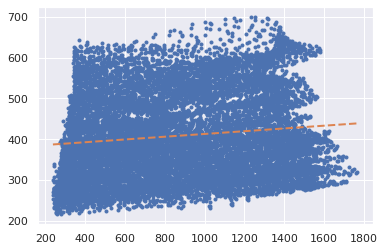

In [121]:
# Rfp to yfp-channel error
plot_df = fluor_df.loc[fluor_df.frame>45,:]
x, y = plot_df[['yfp','cfp']].values.T
pfit = np.polyfit(x,y,1)
a, b = pfit
print(pfit)
_ = plt.plot(x, y,'.')
x_sim = np.linspace(x.min(),x.max(),10)
y_sim = a*x_sim + b
_ = plt.plot(x_sim, y_sim, '--')


### Determining growth rate phases by yfp colonies

In [29]:
mma = importlib.reload(mma)
pad_ind = 6

In [8]:
procdiff = mma.ProcessUnorderedDiff(acq, pad_ind, scale=1, sigma=2, bg_sigma=64, 
                                    print_img=True, bg_option='pos_list',diff=True)
plt.close('all')

In [30]:
fitter = mma.FrontFitter(acq, diff=True)
pad_df = fitter.pad_peaks(pad_ind)

In [10]:
csv_fn = os.path.join(acq.super_dir,'csvs','diff_pad{}.csv'.format(pad_ind))
pad_df = pd.read_csv(csv_fn)
thresh_dict = pad_df[['frame','channel','thresh']].groupby(['frame','channel']).agg(np.min)


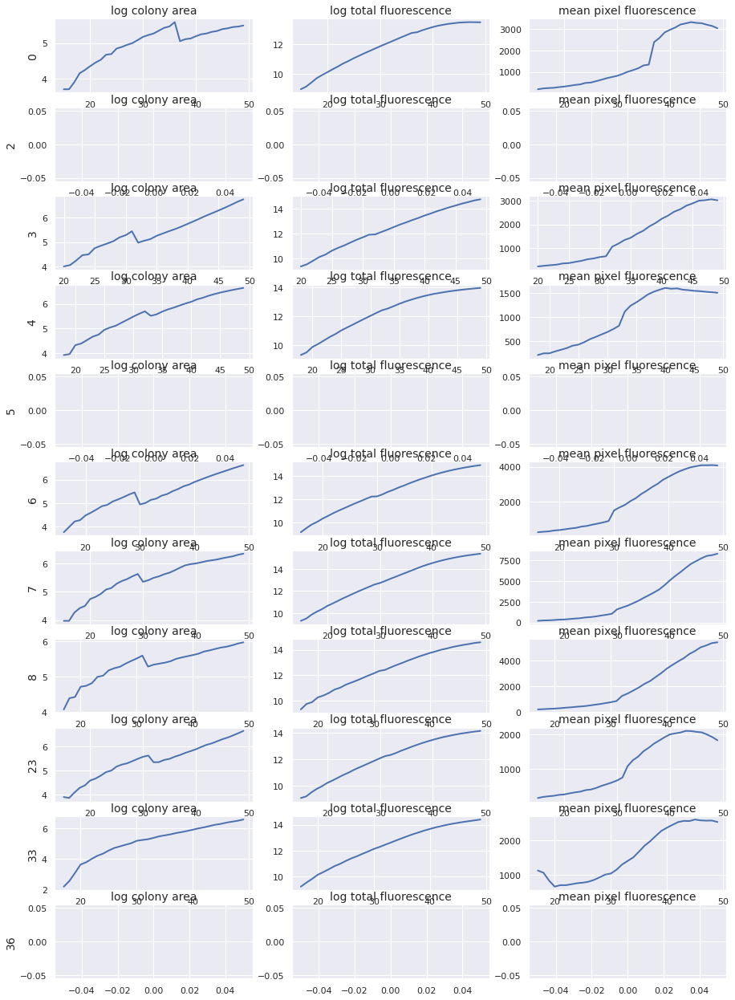

In [87]:
sub_metadf = metadata_df.groupby(['inducers','sender','deadcini']).get_group(('ir','jao',False))
n_pads = sub_metadf.shape[0]
fig, axs = plt.subplots(n_pads,3,figsize=(15,n_pads*2))
for plot_row, pad_ind in enumerate(sub_metadf.index.values):
    procdiff = mma.ProcessUnorderedDiff(acq, pad_ind, scale=scale, sigma=sigma, bg_sigma=bg_sigma, 
                                    print_img=False, bg_option='comb',diff=True)
    procdiff._setup(False)
    nf, nc, nh, nw = procdiff.diff_arr.shape
    areas = np.zeros(50)
    fluors = np.zeros(50)
    csv_fn = os.path.join(acq.super_dir,'csvs','pad{}.csv'.format(pad_ind))
    pad_df = pd.read_csv(csv_fn)
    thresh_dict = pad_df[['frame','channel','thresh']].groupby(['frame','channel']).agg(np.min)
    for f_i in np.arange(50):
        yfp_arr = procdiff.filt_arr[f_i,0,:,:]
        key = (f_i, 2)
        if key in thresh_dict.index:
            thresh = thresh_dict.loc[key,'thresh']
            bw_im = yfp_arr > thresh
            if np.sum(bw_im)>40:
                masks = skimage.measure.label(bw_im)
                rp = skimage.measure.regionprops(masks, yfp_arr)[0]
                areas[f_i] = rp.area
                fluors[f_i] = np.sum(yfp_arr[yfp_arr>thresh])
    a_vec = areas[areas>1]
    fl_vec = fluors[areas>1]
    f_vec = np.arange(50)[areas>1]
    axs[plot_row, 0].plot(f_vec,np.log(a_vec))
    axs[plot_row, 0].set_title('log colony area')
    axs[plot_row, 0].set_ylabel(pad_ind)
    axs[plot_row, 1].plot(f_vec,np.log(fl_vec))
    axs[plot_row, 1].set_title('log total fluorescence')
    axs[plot_row, 2].plot(f_vec,fl_vec/a_vec)
    axs[plot_row, 2].set_title('mean pixel fluorescence')



/home/jparkin/anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


Text(0.5, 1.0, '[3.97225150e-04 4.61631278e+00]')

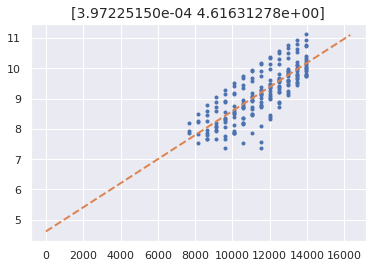

In [25]:
bvec = f_all_list < 30
f_sub, fl_sub = f_all_list[bvec]*8*60,np.log(fl_all_list)[bvec]
pfit = np.polyfit(f_sub, fl_sub, 1)
pfn = np.poly1d(pfit)
plt.plot(f_sub, fl_sub,'.')
f_sim = np.arange(35)*8*60
plt.plot(f_sim, pfn(f_sim),'--')
plt.title(pfit)

### Testing out new threshold crossing components
* distance as it is is the value r - ri. you'll need to measure ri somehow. 
* measure ri by taking sqrt of the area i suppose

In [23]:
mma = importlib.reload(mma)

In [41]:
pad_ind = 7
# tiff_dir = os.path.join('/central','scratchio','jparkin','tiffstacks',acq.expname,acq.acqname)
# tiff_fn = os.path.join(tiff_dir, 'pad{}.tiff'.format(pad_ind))
padhelper = mma.WriteHelper(acq, scale=1, pad_ind=pad_ind, bg_option='pos_list',sigma=2,bg_sigma=64)
# padhelper._check_tiff_metadata(padhelper.tiff_fn)
# arr = padhelper.load_tiffstack(padhelper.tiff_fn)

In [24]:
pad_ind = 7
procdiff = mma.ProcessUnorderedDiff(acq, pad_ind, scale=1, sigma=2, bg_sigma=64, 
                                    print_img=True, bg_option='pos_list',diff=True)
plt.close('all')

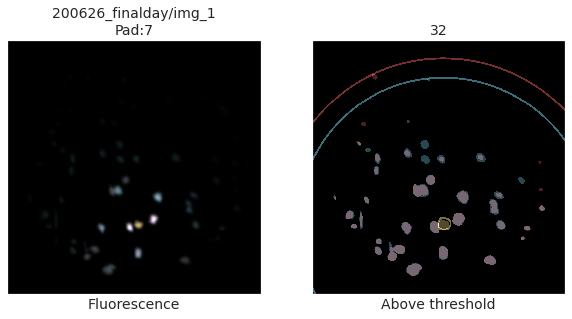

In [26]:
procdiff.diff = True
procdiff._setup_printer()
_ = procdiff.process_frame_stacks(32)

## Trying to find out the best approach for a "recruitment" metric
Start with trying to find the final occupancy of the pad. do this by summing or taking max over each mask stack.

In [5]:
def calc_recru_frame(frame, mask_chan, filt_arr, mask_arr, thresh_df):
    chan=2
    img_arr = filt_arr[frame,chan,:,:].copy()
    img_mask = mask_arr[frame,mask_chan,:,:]>0
    max_val = thresh_df.loc[('arr',chan,frame),'threshold']
    img_arr[img_arr>max_val] = max_val
    thresh = skimage.filters.threshold_otsu(img_arr)
    img_thresh = img_arr>thresh
#     img_thresh = (img_arr + img_mask)>0
#     if thresh < max_val/9:
#         thresh = max_val
    cell_area = np.sum(img_thresh)*(acq.pixel_size**2)/1e6
    masked_area = np.sum(img_mask)*(acq.pixel_size**2)/1e6
    sender_area = np.sum(mask_arr[frame,0,:,:]>0)*(acq.pixel_size**2)/1e6
    return np.array([masked_area, cell_area])

def calc_recru_pad(acq, pad_ind, mask_chan, proc_args):
    proc = mma.ProcessUnorderedDiff(acq, pad_ind, **proc_args)
    proc._setup(False)
    thresh_df = proc.thresh_df.copy()
    filt_arr, mask_arr = proc.filt_arr, proc.filt_mask
    recru_arr = np.array([calc_recru_frame(xx, mask_chan, filt_arr, mask_arr, thresh_df) for xx in acq.frame_vec])
    cols = ['pad','mask_chan','frame','masked_area','cell_area']
    pad_vec, mc_vec = np.ones(recru_arr.shape[0])*pad_ind, np.ones(recru_arr.shape[0])*mask_chan
    d_vecs = [pad_vec, mc_vec, acq.frame_vec, recru_arr[:,0], recru_arr[:,1]]
    out_df = pd.DataFrame(dict(zip(cols,d_vecs)))
    return out_df


recru_df = [calc_recru_pad(acq, xx, yy, procdiff_args_dict) for xx in np.arange(37) for yy in [1,2]]
recru_df = pd.concat(recru_df, ignore_index=True)

In [6]:
b_vec = (recru_df.frame>55)&(recru_df.frame<75)
sub_recru_df = recru_df.loc[b_vec,:]
b_vec = metadata_df['sender_present']&(metadata_df['skip']==False)
keep_pads = metadata_df.index.values[b_vec]
lam = lambda x : x in keep_pads
b_vec = sub_recru_df['pad'].apply(lam)
sub_recru_df = sub_recru_df.loc[b_vec,:].copy()


In [14]:
metadata_df

,inducers,sender,deadcini,skip,sender_present,mdi,label
0,ir,jao,False,True,True,2,Active\nWeak sender\nskip
1,ir,k25,False,False,False,3,Active\nStrong sender\nNo sender
2,ir,jao,False,False,False,0,Active\nWeak sender\nNo sender
3,ir,jao,False,False,True,1,Active\nWeak sender
4,ir,jao,False,False,True,1,Active\nWeak sender
5,ir,jao,False,False,False,0,Active\nWeak sender\nNo sender
6,ir,jao,False,False,True,1,Active\nWeak sender
7,ir,jao,False,False,True,1,Active\nWeak sender
8,ir,jao,False,False,True,1,Active\nWeak sender
9,ir,unk,True,False,False,6,Active\nUnknown sender\nDead Cini\nNo sender


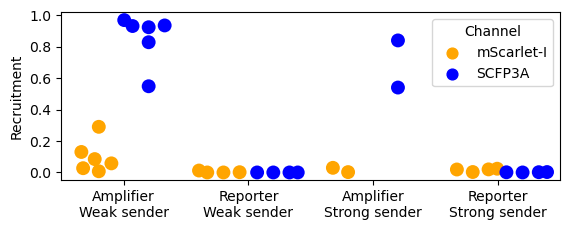

In [34]:
# sub_recru_df = recru_df.copy()
plt.style.use('default')
plt.style.use('fast')
plot_labs = ['Amplifier\nWeak sender','Reporter\nWeak sender','Amplifier\nStrong sender','Reporter\nStrong sender']
mdi_vec = [label_df.index.values[label_df.label==xx][0] for xx in plot_labs]

lam = lambda x : metadata_df.loc[x,'mdi']
sub_recru_df['mdi'] = sub_recru_df['pad'].apply(lam)

lam = lambda x : x in mdi_vec
sub_recru_df = sub_recru_df.loc[sub_recru_df.mdi.apply(lam),:].copy()

# keep_pads = metadata_df.index.values[(metadata_df.sender_present)&(metadata_df.skip==False)]
# lam = lambda x : x in keep_pads
# sub_recru_df = sub_recru_df.loc[sub_recru_df['pad'].apply(lam),:].copy()

lam = lambda x : label_df.loc[x,'label']
sub_recru_df['Condition'] = sub_recru_df.mdi.apply(lam)

mdi_x = np.arange(len(mdi_vec))
x_dict = dict(zip(mdi_vec,mdi_x))
x_labs = label_df.loc[mdi_vec,'label']

lam = lambda x : x_dict[x]
sub_recru_df['x'] = sub_recru_df.mdi.apply(lam)

conv_channel = lambda x : dict(zip([1.0,2.0],['mScarlet-I','SCFP3A']))[x]
sub_recru_df['Channel'] = sub_recru_df.mask_chan.apply(conv_channel)

cmap = dict(zip(['mScarlet-I','SCFP3A'], ['orange','blue']))

sub_recru_df['Recruitment'] = sub_recru_df.masked_area / sub_recru_df.cell_area

keep_inds = []
recru_gb = sub_recru_df.groupby(['pad','mask_chan'])
for key, sub_df in recru_gb:
    max_recru = sub_df.Recruitment.max()
    keep_inds.append(sub_df.index.values[sub_df.Recruitment==max_recru][0])
plot_df = sub_recru_df.loc[keep_inds,:].copy()


fig, ax = plt.subplots(1,1,figsize=(5.8,2.4))
ax = sns.swarmplot(data=plot_df, x='x',y='Recruitment',hue='Channel', 
                   ax=ax,size=10,palette=cmap,dodge=True)
ax.set_xticklabels(x_labs)
ax.set_xlabel('')
fig.tight_layout()
fig_tmpl = 'recruitment_200626.{}'
fig_tmpl = os.path.join(acq.super_dir,'figs',fig_tmpl)
for enc in ['png','pdf']:
    fig.savefig(fig_tmpl.format(enc))

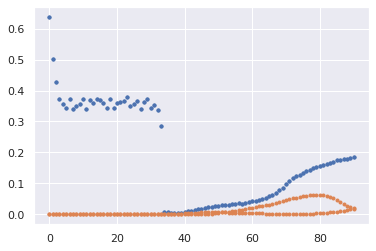

In [57]:
pad_recru_df = recru_df.groupby('pad').get_group(8)
plt.plot(pad_recru_df['frame'],pad_recru_df['cell_area'],'.')
plt.plot(pad_recru_df['frame'],pad_recru_df['masked_area'],'.')

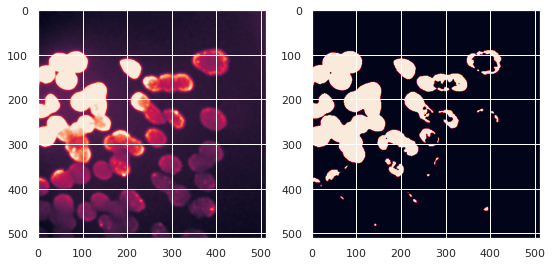

In [80]:
pad_ind, mask_chan = 8, 2
proc = mma.ProcessUnorderedDiff(acq, pad_ind, **procdiff_args_dict)
proc._setup(False)
thresh_df = proc.thresh_df.copy()
filt_arr, mask_arr = proc.filt_arr, proc.filt_mask
frame = 70

chan=2
img_arr = filt_arr[frame,chan,:,:].copy()
img_mask = mask_arr[frame,mask_chan,:,:]>0
max_val = thresh_df.loc[('arr',chan,frame),'threshold']
img_arr[img_arr>max_val] = max_val
thresh = skimage.filters.threshold_otsu(img_arr)
img_thresh = img_arr>thresh
#     img_thresh = (img_arr + img_mask)>0
#     if thresh < max_val/9:
#         thresh = max_val
cell_area = np.sum(img_thresh)*(acq.pixel_size**2)/1e6
masked_area = np.sum(img_mask)*(acq.pixel_size**2)/1e6
sender_area = np.sum(mask_arr[frame,0,:,:]>0)*(acq.pixel_size**2)/1e6
fig, axs = plt.subplots(1,2,figsize=(9,5))
axs[0].imshow(img_arr)
axs[1].imshow(img_thresh)
# recru_arr = np.array([calc_recru_frame(xx, mask_chan, filt_arr, mask_arr, thresh_df) for xx in acq.frame_vec])



added  (3.0, 13) Reporter
Weak sender
added  (3.0, 17) Reporter
Weak sender
added  (3.0, 19) Reporter
Weak sender
added  (5.0, 13) Reporter
Weak sender
added  (5.0, 17) Reporter
Weak sender
added  (5.0, 19) Reporter
Weak sender
added  (5.0, 20) Reporter
Weak sender
added  (5.0, 27) Reporter
Strong sender
added  (5.0, 30) Reporter
Strong sender


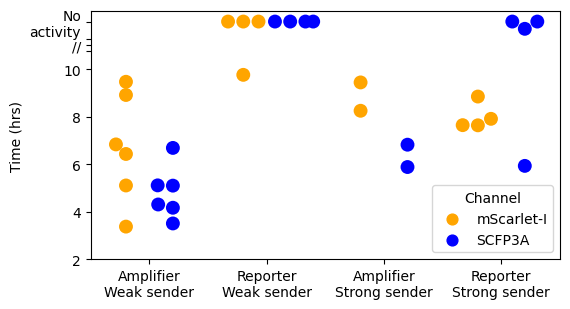

In [35]:
b_vec = (peaks_df.channel>2)&(peaks_df['diff'])&(peaks_df.level>1)
sub_peaks_df = peaks_df.loc[b_vec,:].copy()
peaks_gb = sub_peaks_df[['pad','channel','time','mdi']].groupby(['pad','channel'])
agg_min_peaks = peaks_gb.agg(np.min).reset_index()

mdi_x = np.arange(len(mdi_vec))
x_dict = dict(zip(mdi_vec,mdi_x))

x_labs = label_df.loc[mdi_vec,'label']

lam = lambda x : x in mdi_vec
sub_agg = agg_min_peaks.loc[agg_min_peaks.mdi.apply(lam),:].copy()

sub_agg['time_hrs'] = sub_agg.time / 3600
# Add rows with large times where mdi's are missing
gb_tries = sub_agg.groupby(['channel','pad'])
md_gb = metadata_df.groupby('mdi')

lam = lambda x : x in mdi_vec
pad_list = metadata_df.index.values[metadata_df.mdi.apply(lam)]
keys_list = [(yy,zz) for yy in [3.0,5.0] for zz in pad_list]
for key in keys_list:
    mask_chan, pad_ind = key
    if key in gb_tries.groups.keys() or metadata_df.loc[pad_ind,'skip']:
        pass
#         print('passed ',key, metadata_df.loc[pad_ind,'label'])
    else:
        print('added ',key, metadata_df.loc[pad_ind,'label'])
        mdi = metadata_df.loc[pad_ind,'mdi']
        d_vec = [mdi, mask_chan, 12, pad_ind]
        c_vec = ['mdi','channel','time_hrs','pad']
        new_row = pd.DataFrame(dict(zip(c_vec,d_vec)),index=[0])
        sub_agg = sub_agg.append(new_row, ignore_index=True)

lam = lambda x : label_df.loc[x,'label']
sub_agg['Condition'] = sub_agg.mdi.apply(lam)

lam = lambda x : x_dict[x]
sub_agg['x'] = sub_agg.mdi.apply(lam)

conv_channel = lambda x : dict(zip([3.0,5.0],['mScarlet-I','SCFP3A']))[x]
sub_agg['Channel'] = sub_agg.channel.apply(conv_channel)

cmap = dict(zip(['mScarlet-I','SCFP3A'], ['orange','blue']))

fig, ax = plt.subplots(1,1,figsize=(5.8,3.2))

ax = sns.swarmplot(data=sub_agg, x='x',y='time_hrs',hue='Channel', ax=ax,
                   size=10,palette=cmap,dodge=True)
yticks = [2,4,6,8,10,10.75,11,11.25,12]
yticklabels = ['{}'.format(xx) for xx in yticks]
yticklabels[-1] = 'No\nactivity'
yticklabels[-2] = ''
yticklabels[-3] = '//'
yticklabels[-4] = ''
ax.set_yticks(yticks)
# ax.legend(bbox_to_anchor=(1.01,1),loc='upper left',borderaxespad=0.)
ax.set_yticklabels(yticklabels)
ax.set_xticklabels(x_labs)
ax.set_ylabel('Time (hrs)')
ax.set_xlabel('')
fig.tight_layout()
fig_tmpl = 'initiation_time_200626.{}'
fig_tmpl = os.path.join(acq.super_dir,'figs',fig_tmpl)
for enc in ['png','pdf']:
    fig.savefig(fig_tmpl.format(enc))

[Text(0, 0, 'Active'),
 Text(1, 0, 'Inactive'),
 Text(2, 0, 'Active\nStrong sender'),
 Text(3, 0, 'Inactive\nStrong sender')]

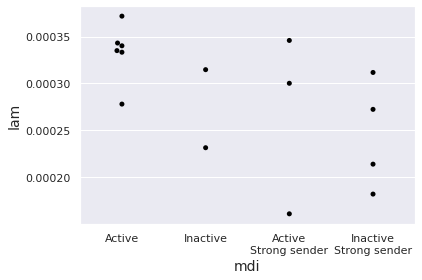

In [155]:
lams_df = peaks_df.groupby('pad').agg(np.median).reset_index()

x_labs = label_df.loc[mdi_vec,'label']

lam = lambda x : x in mdi_vec
lams_df = lams_df.loc[lams_df.mdi.apply(lam),:].copy()

lam = lambda x : label_df.loc[x,'label']
lams_df['Condition'] = lams_df.mdi.apply(lam)

lam = lambda x : x_dict[x]
lams_df['x'] = lams_df.mdi.apply(lam)

ax = sns.swarmplot(data=lams_df, x='mdi',y='lam',color='black')
ax.set_xticklabels(x_labs)

## checking in on peak fitting again


In [141]:
pad_ind = 0
chan = 5
csvs_dir = os.path.join(acq.super_dir, 'csvs')
pad_df_fn = os.path.join(csvs_dir, 'pad{}.csv'.format(pad_ind))
pad_df = pd.read_csv(pad_df_fn)

fitter = mma.FrontFitter(acq, diff=True)#, chan_bin_widths=[400,100,500])

# bin distances
bin_width = acq.pixel_size
d_vec = pad_df.dist.values
pad_df['dist_binned'] = (d_vec//bin_width)*bin_width + (bin_width/2)
inds = [(int(frame), pad_ind) for frame in pad_df.frame.values]
t_vec = fitter.time_df.loc[inds,'time'].values
pad_df['time'] = t_vec
gb_chan = pad_df.groupby('channel')
chan_df = gb_chan.get_group(chan)


In [142]:
gb_cols = ['fluor','frame','dist_binned']
fluor_gb_frame_db = chan_df[gb_cols].groupby(gb_cols[1:])
q_lamb = lambda x : np.quantile(x, 0.95)
agg_df = fluor_gb_frame_db.agg(q_lamb).reset_index()
piv_df = agg_df.pivot(index='dist_binned',values='fluor',columns='frame')

In [143]:
out_list = []
chan_bin = fitter.chan_bin_dict[chan]
n_bins = (agg_df.fluor.max()-agg_df.fluor.min())//chan_bin
thresh_vec = agg_df.fluor.min() + np.arange(n_bins)*chan_bin
for label, thresh in enumerate(thresh_vec):
    bool_vec = agg_df.fluor >= thresh
    sub_df = agg_df.loc[bool_vec, gb_cols].groupby(gb_cols[-1]).agg(np.min).reset_index()
    d_vec, frame_vec = sub_df.dist_binned.values, sub_df.frame.values
    peaks = mma.signal.find_peaks(-1*frame_vec)[0]
    sub_df['level'] = label
    sub_df['thresh'] = thresh
    out_list.append(sub_df.loc[peaks,:])
sub_peaks_df = pd.concat(out_list, ignore_index=True)

In [144]:
label = 0
thresh = thresh_vec[label]
bool_vec = agg_df.fluor >= thresh
sub_df = agg_df.loc[bool_vec, gb_cols].groupby(gb_cols[-1]).agg(np.min).reset_index()
d_vec, frame_vec = sub_df.dist_binned.values, sub_df.frame.values
peaks = mma.signal.find_peaks(-1*frame_vec)[0]
sub_df['level'] = label
sub_df['thresh'] = thresh
out_list.append(sub_df.loc[peaks,:])

<Figure size 432x288 with 0 Axes>

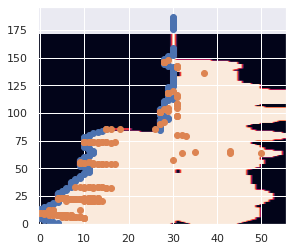

<Figure size 432x288 with 0 Axes>

In [145]:
plt.imshow(piv_df.values>thresh,aspect=1/4,origin='lower')
plt.plot(frame_vec-piv_df.columns.min(), d_vec/bin_width,'o')
plt.plot(sub_peaks_df.frame-piv_df.columns.min(), sub_peaks_df.dist_binned/bin_width,'o')
plt.figure()
# sns.scatterplot(data=peaks_df, x='frame',y='dist_binned',hue='level')

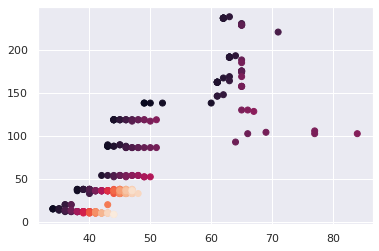

In [146]:
plot_df = sub_peaks_df.loc[:,:].copy()
plt.scatter(plot_df.frame, plot_df.dist_binned, c=plot_df.level.values.astype(np.float))

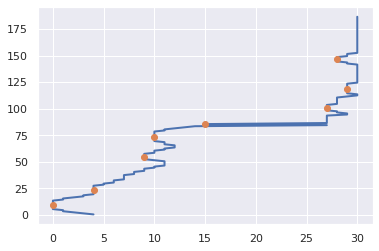

In [147]:
plt.plot(frame_vec-piv_df.columns.min(),d_vec/bin_width)
plot_df = sub_peaks_df.loc[sub_peaks_df.level==1,:]
plt.plot(plot_df.frame-piv_df.columns.min(), plot_df.dist_binned/bin_width,'o')

In [61]:
pad_df.head()

,frame,x,y,pad,fluor,channel,scale,thresh,dist,rad,acqname,dist_binned,time
0,11.0,267,366,7.0,145.29224,2.0,1.0,128.639084,0.0,4.465512,200626_finalday_img_1,0.807812,5400.0
1,11.0,268,366,7.0,158.65962,2.0,1.0,128.639084,0.0,4.465512,200626_finalday_img_1,0.807812,5400.0
2,11.0,269,366,7.0,154.04385,2.0,1.0,128.639084,0.0,4.465512,200626_finalday_img_1,0.807812,5400.0
3,11.0,270,366,7.0,131.21707,2.0,1.0,128.639084,0.0,4.465512,200626_finalday_img_1,0.807812,5400.0
4,11.0,266,367,7.0,151.03314,2.0,1.0,128.639084,0.0,4.465512,200626_finalday_img_1,0.807812,5400.0


## Ohter tests

In [ ]:
im_dist, y_thresh, rad_arr = procdiff._yfp_dist(38)

In [81]:
pad_ind = 7
scale = 1
procdiff = mma.ProcessUnorderedDiff(acq, pad_ind, scale=1, sigma=2, bg_sigma=64, 
                                    print_img=False, bg_option='pos_list',diff=True)

In [27]:
out_dir = os.path.join(acq.super_dir, 'csvs')
# fn_tmpl = os.path.join(out_dir, "{}pad{}.csv".format('diff_',pad_ind))
# pad_df = pd.read_csv(fn_tmpl)
# pad_df['rad'] = 0
# yfp_gb_frame = pad_df.groupby('channel').get_group(2).groupby('frame')
# for frame, sub_df in yfp_gb_frame:
#     channel, pad, thresh = sub_df[['channel','pad','thresh']].values[0]
#     channel, pad = [int(xx) for xx in [channel, pad]]
#     frame = np.int(frame)
#     img = procdiff.arr_dict['diff'][frame, channel, :, :] 
#     im_thresh = img > thresh
#     d_coeff = acq.pixel_size * scale
#     rad = np.sqrt(d_coeff * np.sum(im_thresh)/np.pi)
#     pad_df.loc[pad_df.frame==frame, 'rad'] = rad
# pad_df.to_csv(fn_tmpl, index=False)

18


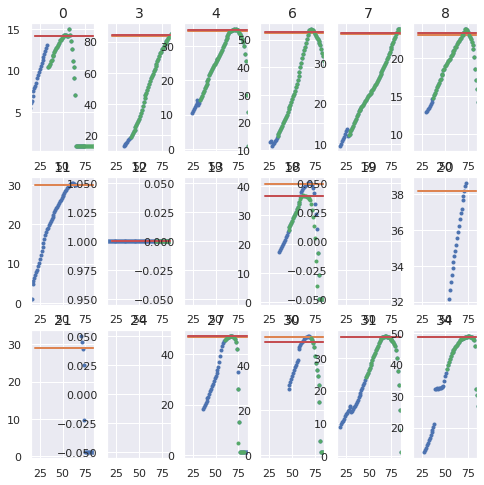

In [28]:
pad_ind_list = [13,11,19,24,30,21,18,27,8,0,31,12,6,34,3,20,4,7]
pad_ind_list = np.sort(np.array(pad_ind_list))
print(len(pad_ind_list))
fig, axs = plt.subplots(3,6,figsize=(8,8))
df_list = []
for prefix, diff in [('diff_', True), ('',False)]:
    for i, pad_ind in enumerate(pad_ind_list):
        ax = axs[np.int(i//6),np.mod(i, 6)]
        fn_tmpl = os.path.join(out_dir, "{}pad{}.csv".format(prefix,pad_ind))
        pad_df = pd.read_csv(fn_tmpl)
        pad_df['diff'] = diff
#         df_list.append(pad_df)
        sub_df = pad_df.loc[(pad_df.rad>0)&(pad_df.channel==5),:].groupby('frame').agg(np.max).reset_index()
        max_col = sub_df.rad.quantile(0.9)
        ax.plot((sub_df.frame), sub_df.rad,'.')
        ax.plot([20,90], [max_col, max_col],'-')
        ax.set_title(pad_ind)
        ax.set_xlim([15,85])
# cross_df = pd.concat(df_list)    

In [9]:
cross_df.shape

(53311812, 12)

In [88]:
def est_lam(pad_ind, diff=False):
    out_dir = os.path.join(acq.super_dir, 'csvs')
    prefix = ''
    if diff:
        prefix = 'diff_'
    fn_tmpl = os.path.join(out_dir, "{}pad{}.csv".format(prefix,pad_ind))
    pad_df = pd.read_csv(fn_tmpl)
    pad_ss = pad_df.loc[pad_df.channel==2,['fluor','frame']].groupby('frame').agg(np.sum)
    pad_ss = pad_ss.loc[slice(18,70),:].reset_index()
    pad_ss = pad_ss.sort_values(by='frame')
    fv = pad_ss.frame.values.astype(np.int)
    time_vec = np.array([acq.time_df.loc[(xx, pad_ind),'time'] for xx in fv])
    if len(pad_ss) > 12:
        med_vec = signal.savgol_filter(pad_ss.fluor.values, 9, 1)
    else:
        med_vec = pad_ss.fluor.values
    med_vec[med_vec<1] = 1
    y_vec = np.diff(np.log(med_vec))/np.diff(time_vec)
    bool_vec = (y_vec<1e-3)&(y_vec>1e-4)
    return np.median(y_vec[bool_vec]), pad_ss.frame.values[:-1][bool_vec]
#     return y_vec[bool_vec], time_vec[:-1][bool_vec]

/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


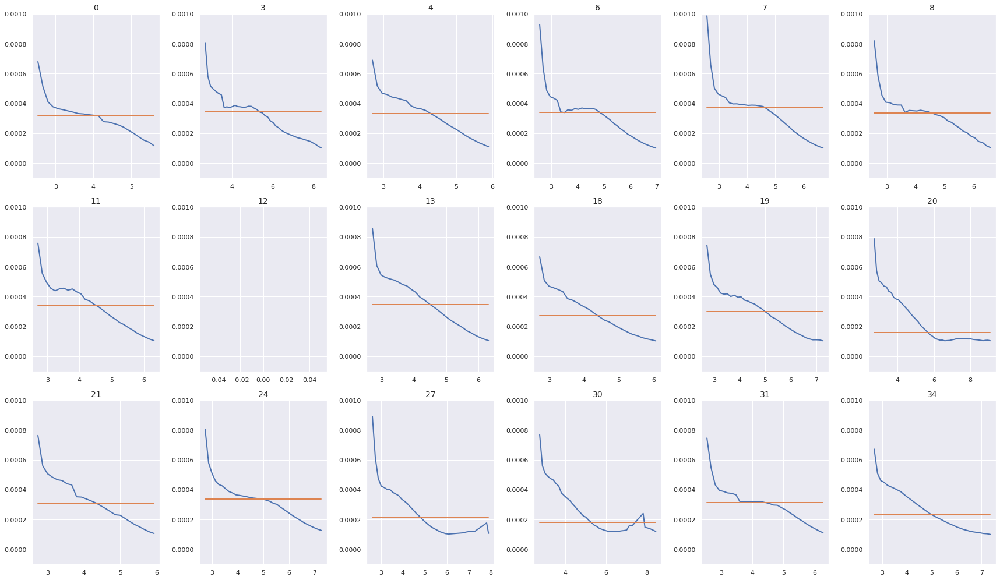

In [130]:
fig, axs = plt.subplots(3,6,figsize=(24,14))
pad_ind_list = [13,11,19,24,30,21,18,27,8,0,31,12,6,34,3,20,4,7]
pad_ind_list = np.sort(np.array(pad_ind_list))
for i, pad_ind in enumerate(pad_ind_list):
    ax = axs[np.int(i//6),np.mod(i, 6)]
    y_vec, time_vec = est_lam(pad_ind)
#     if len(time_vec) > 1:
#         x_vec = time_vec[:-1]
#     else:
    x_vec = time_vec
    ax.plot(x_vec/3600, y_vec)
    ax.plot(x_vec/3600, np.ones_like(x_vec)*np.median(y_vec))
    ax.set_title(np.int(pad_ind))
    ax.set_ylim([-0.0001,0.001])
fig.tight_layout()

In [151]:
mma = importlib.reload(mma)

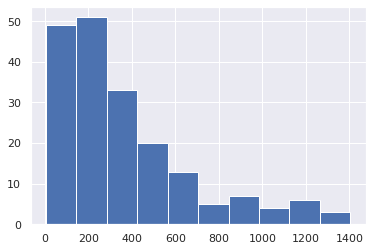

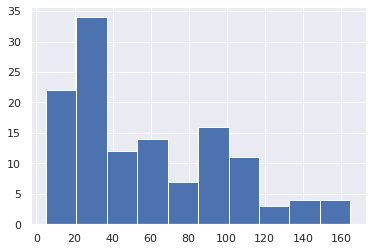

In [184]:
sub_peaks_df = peaks_df.groupby(['pad','diff','channel']).get_group((7,True,3))
_  = plt.hist(sub_peaks_df.thresh)
plt.figure()
sub_peaks_df = peaks_df.groupby(['pad','diff','channel']).get_group((2,True,3))
_  = plt.hist(sub_peaks_df.thresh)

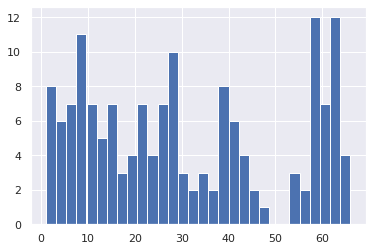

In [178]:
procdiff = mma.ProcessUnorderedDiff(acq, 9, scale=scale, sigma=sigma, bg_option=bg_option,
                                    bg_sigma=bg_sigma, sg_width=sg_width, sg_order=sg_order)
procdiff._setup(False)
lab_df = procdiff._make_lab_df_from_stacks()
_ = plt.hist(lab_df.duration.values,bins=30)

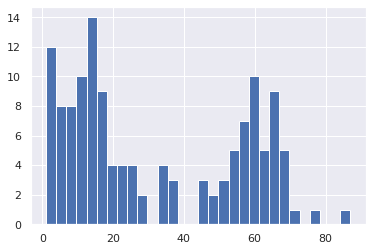

In [177]:
procdiff = mma.ProcessUnorderedDiff(acq, 7, scale=scale, sigma=sigma, bg_option=bg_option,
                                    bg_sigma=bg_sigma, sg_width=sg_width, sg_order=sg_order)
procdiff._setup(False)
lab_df = procdiff._make_lab_df_from_stacks()
_ = plt.hist(lab_df.duration.values,bins=30)

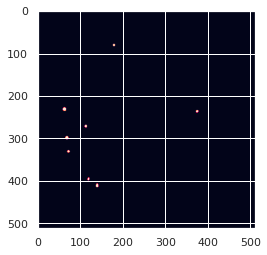

In [165]:
sub_lab_df = lab_df.loc[lab_df['diff']==True,:]
sub_lab_df = sub_lab_df.loc[sub_lab_df.duration>6,:]
plt.imshow(procdiff.diff_mask[24,2,:,:]>0)

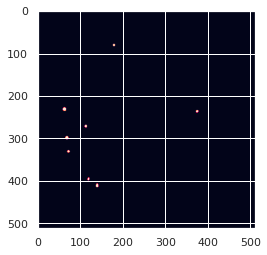

In [166]:
mask_copy = skimage.morphology.remove_small_objects(procdiff.diff_mask[:,2,:,:]>0,90)
plt.imshow(mask_copy[24,:,:])

In [380]:
sender_present_pads = np.unique(peaks_df.loc[(peaks_df.channel==2)&(peaks_df['diff']==True),'pad'].values)

array([ 0,  3,  4,  6,  7,  8, 11, 12, 13, 18, 19, 20, 21, 23, 24, 27, 30,
       31, 33, 34])

In [19]:
# load peaks_df
peaks_fn = os.path.join(acq.super_dir,'csvs','peaks_df.csv')
peaks_df = pd.read_csv(peaks_fn)

In [8]:
# Make peaks_df
import itertools

# prep metadata objects
all_dfs = []
loop_var = itertools.product(['diff_', ''], np.arange(37))
ct_dict = {2:0,3:20,5:10}
chan_lambda = lambda x : ct_dict[x]
for prefix, pad_ind in loop_var: 
    peak_out_fn = os.path.join(acq.super_dir, "csvs", '{}peaks_pad{}.csv').format(prefix, pad_ind)
    pad_fn = os.path.join(acq.super_dir, "csvs", '{}pad{}.csv').format(prefix, pad_ind)
    if os.path.exists(peak_out_fn):
        in_df = pd.read_csv(peak_out_fn)
        in_df['rad']=0
        lam, frame_vec = est_lam(pad_ind)
        bool_vec = np.array([xx in frame_vec for xx in in_df.frame.values])
        in_df['b_vec'] = bool_vec
        pad_df = pd.read_csv(pad_fn)
        rad_df = pad_df[['frame','channel','rad']].groupby(['frame','channel']).agg(np.min)
        in_gb = in_df.groupby(['frame','channel'])
        for key, sub_df in in_gb:
            if key in rad_df.index:
                in_df.loc[sub_df.index,'rad'] = rad_df.loc[key,'rad']
        radval = in_df.rad.quantile(0.75)
        y = (in_df.dist_binned + in_df.rad)/radval
        in_df['y'] = y
        tmp_bool = np.abs(y.values)>=1
        co = np.ones_like(y)
        ct = in_df.channel.apply(chan_lambda)
        inv_y = 1/y[tmp_bool]
        ind_t = in_df.loc[tmp_bool,'time']*lam
        co[tmp_bool] = np.arcsin(inv_y)*np.exp(ind_t)*radval
        in_df['co_ct'] = ct*(np.pi**2)*700 / (4*co)
        in_df.loc[False==tmp_bool,'co_ct'] = 0
        in_df['lam'] = lam
        in_df['mdi'] = metadata_df.loc[pad_ind,'mdi']
        all_dfs.append(in_df)
peaks_df = pd.concat(all_dfs, ignore_index=True)
peaks_df['l10_cct'] = np.log10(peaks_df['co_ct'].values)
peaks_fn = os.path.join(acq.super_dir,'csvs','peaks_df.csv')
peaks_df.to_csv(peaks_fn)

/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/jparkin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/jparkin/anaconda3/lib/python3.7/site-

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


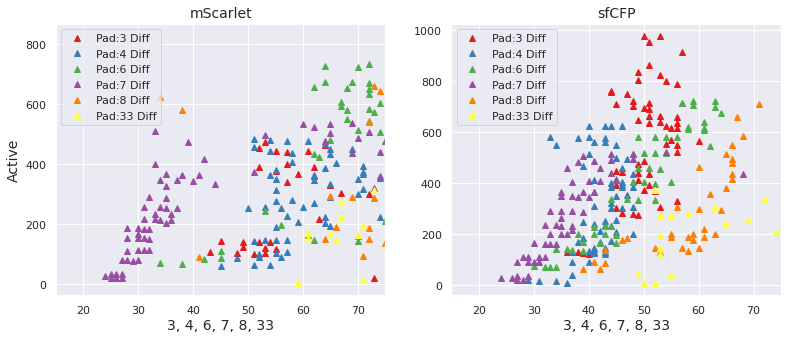

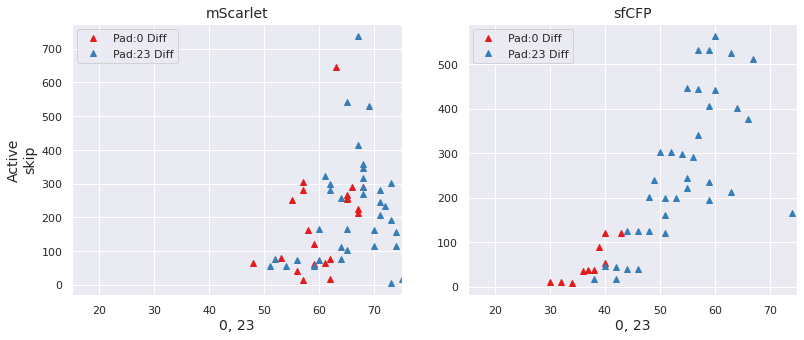

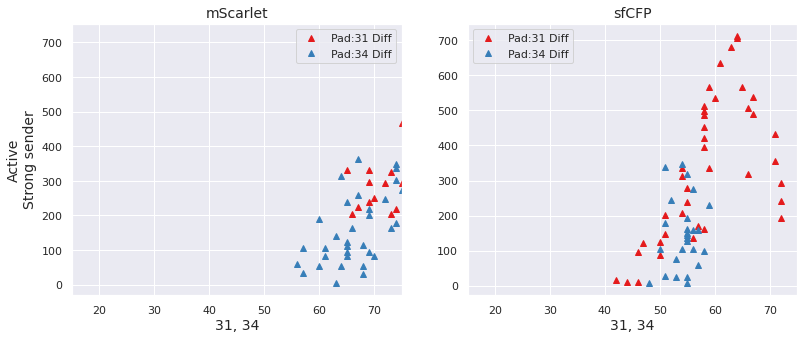

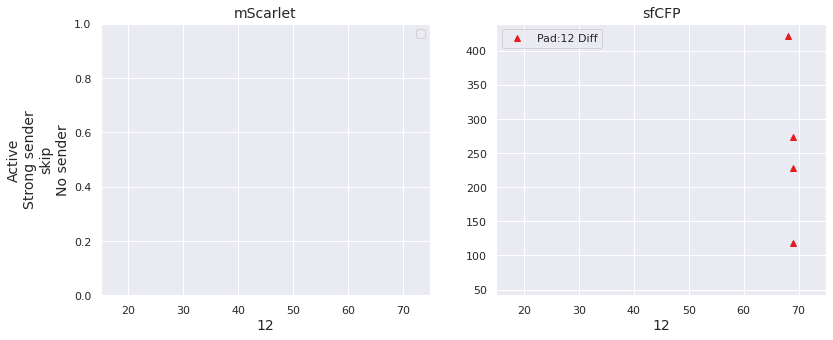

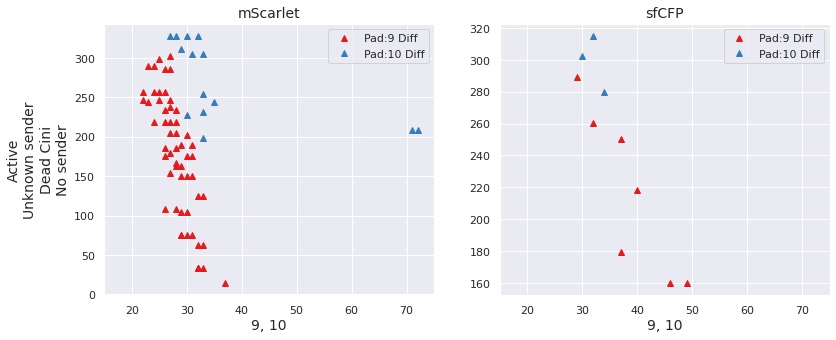

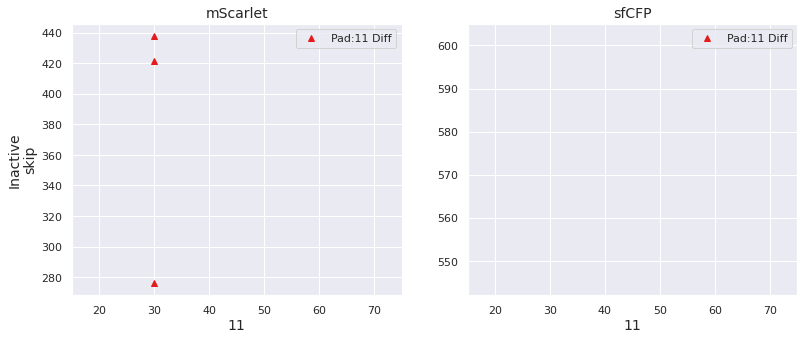

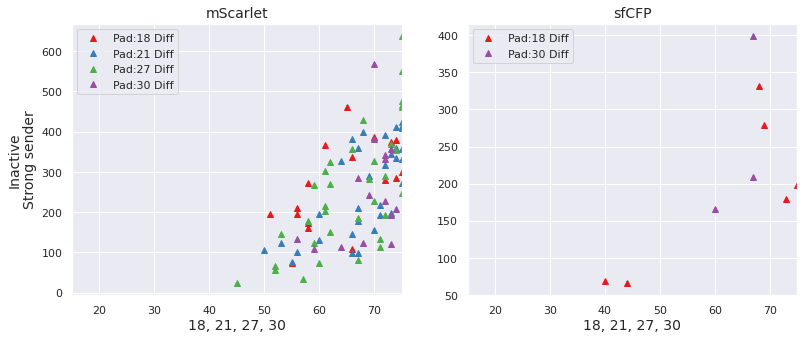

In [336]:
def fn(p, t):
    m, b = p
    return t*m + b

def res(p, t, y):
    yvec = fn(p, t)
    return np.sum(np.log(np.power(y-yvec,2)/2+1))

# gb_pad = peaks_df.loc[(peaks_df.level>=0)&(peaks_df.level<3)&(peaks_df.frame<85)&(peaks_df.channel>2)&(peaks_df['diff']),:].groupby('pad')
metadata_gb = metadata_df.groupby('mdi')
for key, sub_df in metadata_gb:
    fig, axs = plt.subplots(1,2,figsize=(13,5))
    pad_list = np.unique(sub_df.index.values)
    n_pads = len(pad_list)
    if n_pads >= 1:
        c_vec = list(plt.cm.Set1.colors)
        c_dict = dict(zip(pad_list, c_vec))
    for ind in sub_df.index.values:
        if ind in gb_pad.groups.keys():
            sub_pad_df = gb_pad.get_group(ind)
            sub_gb_cd = sub_pad_df.groupby(['channel','diff'])
            for sub_key, plot_df in sub_gb_cd:
                if len(plot_df)<1:
                    plt.close(fig)
                    continue
                chan, diff = sub_key
                ax_i = np.int(chan//4)
                y = plot_df.dist_binned
                m = ['o','^'][np.int(diff)]
                tvec = plot_df.frame
#                 res_lam = lambda p : res(p, tvec, y)
#                 afit = opt.minimize(res_lam, (1e-1,-1e4))
#                 tsim = np.linspace(1e4,5e4,50)
#                 ysim = fn(afit.x, tsim)
                dstr = ['',' Diff'][np.int(diff)]
                label = "Pad:{}{}".format(ind, dstr)
                if len(y)>0:
                    axs[ax_i].plot(tvec, y, m, label=label, c=c_dict[ind])
#                     axs[ax_i].plot(tsim, ysim, '--', c=c_dict[ind])
        else:
            plt.close(fig)
    axs[0].set_ylabel(sub_df['label'].values[0])
    for ax_i, ax in enumerate(axs):
        ax.set_title(['mScarlet','sfCFP'][ax_i])
        ax.set_xlabel(', '.join([str(xx) for xx in sub_df.index.values]))
#         ax.set_xlim([1e4,5e4])
        ax.set_xlim([15,75])
#         ax.set_ylim([-1e2,1e3])
        ax.legend()

/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in less
/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in greater
/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in less
/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in greater
/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in less
/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in greater
/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in less
/home/jparkin/anaconda3/e

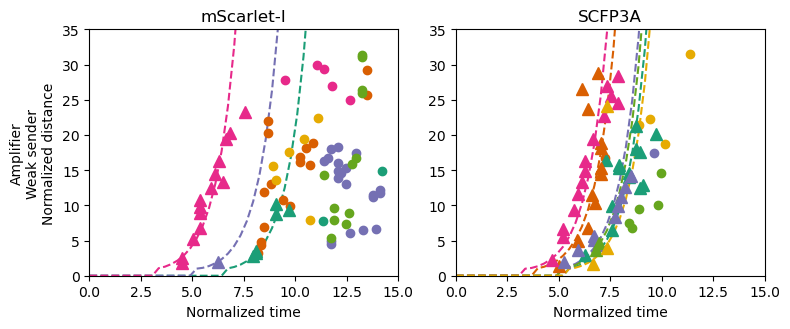

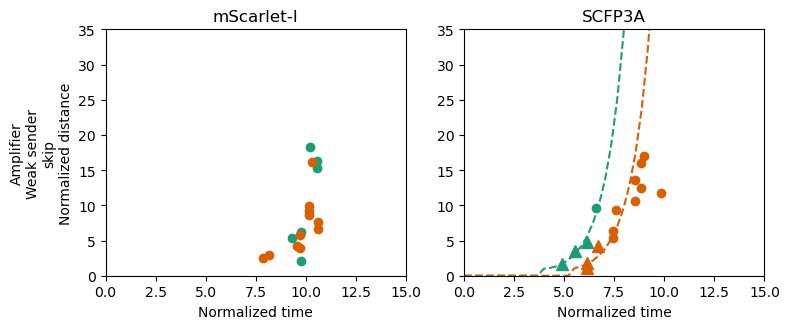

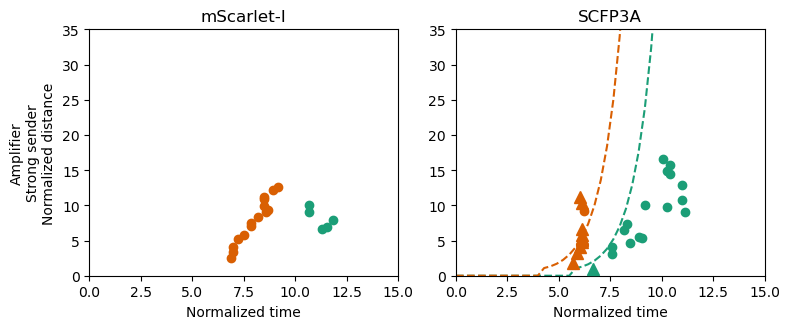

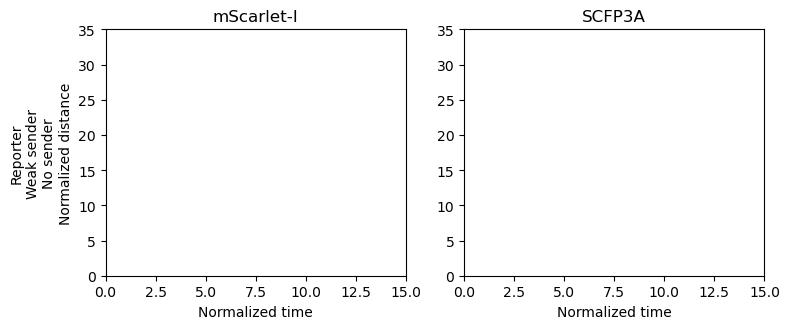

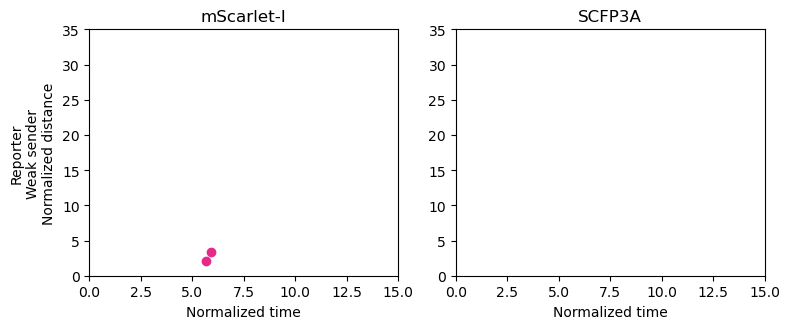

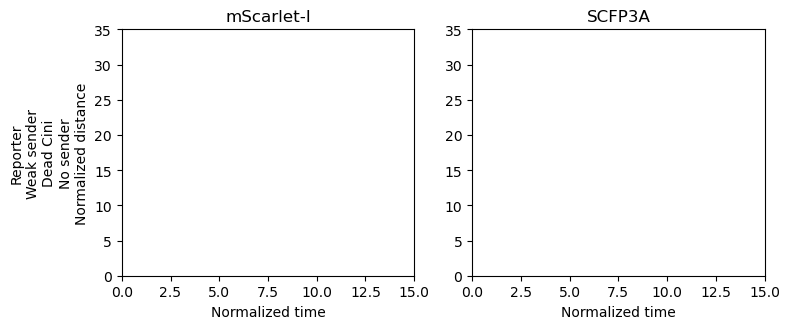

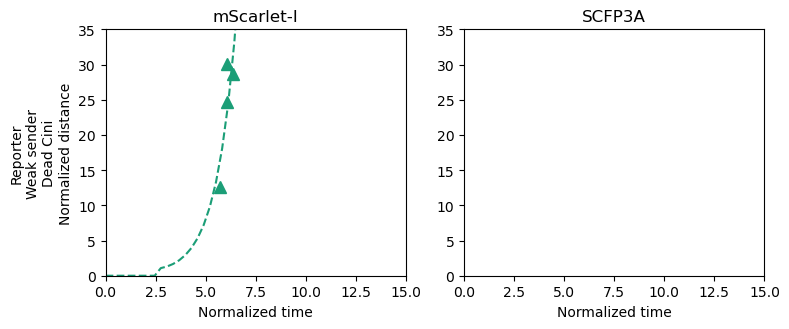

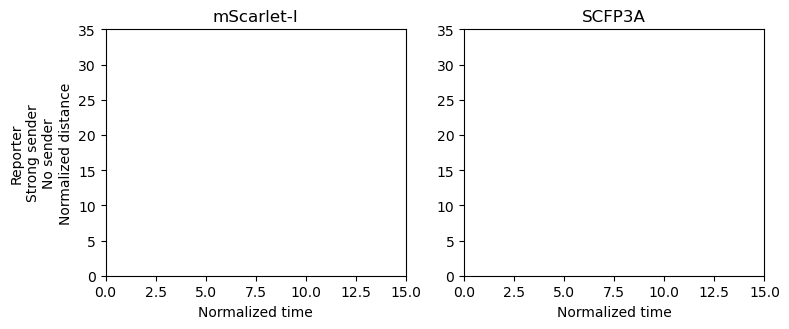

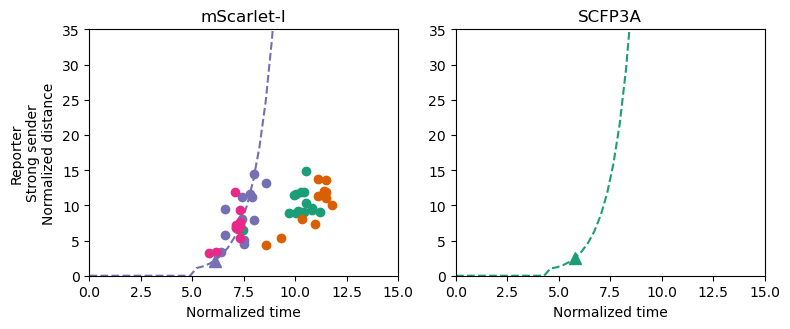

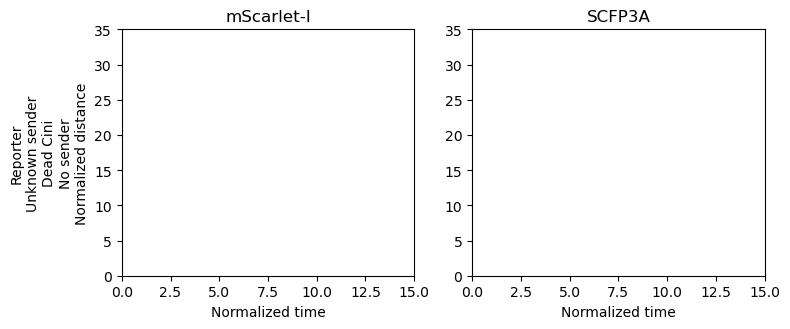

In [68]:
def fn(p, t, radval):
    c0, ct = p
    argument = np.exp(-t)/(radval*c0*4/(ct*700*np.pi**2))
    yvec=1/np.sin(argument)
    yvec[argument<0] = 0
    yvec[argument>np.pi/2] = 0
    return yvec

def res(p, t, y, radval):
    yvec = fn(p, t, radval)
    return np.sum(np.log(np.power(y-yvec,2)/100+1))

def fn2(p, y, radval):
    c0, ct = p
    y[y<=0] = 1e-4
    argument = np.arcsin(1/y)
    t = -np.log(argument*radval*c0*4/(ct*700*np.pi**2))
    t[y<0] = 0
    t[np.isnan(t)] = 0
    return t

def res2(p, t, y, radval):
    c0, ct = p
    if c0 <= 0:
        return np.inf
    tvec = fn2(p, y, radval)
    return np.sum(np.log(np.power(t-tvec,2)/1+1))

gb_pad = peaks_df.loc[(peaks_df.level==2)&(peaks_df.level<5)&(peaks_df.frame<85)&(peaks_df.channel>2)&(peaks_df['diff']),:].groupby('pad')
ct_dict = {3:20,5:10}
fit_df = []
metadata_gb = metadata_df.groupby('mdi')
for key, sub_df in metadata_gb:
    fig, axs = plt.subplots(1,2,figsize=(8,3.4))
    pad_list = np.unique(sub_df.index.values)
    n_pads = len(pad_list)
    if n_pads >= 1:
        c_vec = list(plt.cm.Dark2.colors)
        c_dict = dict(zip(pad_list, c_vec))
    for ind in sub_df.index.values:
        if ind in gb_pad.groups.keys():
            sub_pad_df = gb_pad.get_group(ind)
            sub_gb_cd = sub_pad_df.groupby(['channel','diff'])
            for sub_key, plot_df in sub_gb_cd:
                plot_df = plot_df.loc[plot_df.y<35,:]
                if len(plot_df)<1:
                    plt.close(fig)
                    continue
                neg_df = plot_df.loc[plot_df.b_vec==False,:]
                plot_df = plot_df.loc[plot_df.b_vec,:]
                radval = plot_df.rad.quantile(0.75)
                chan, diff = sub_key
                lam = plot_df.lam.mean()
                ct = ct_dict[chan]
                ax_i = np.int(chan//4)
                y = plot_df.y.values
                m = ['o','^'][np.int(diff)]
                tvec = plot_df.time.values*plot_df.lam.values
                res_c0 = lambda p : res2([p, ct], tvec, y, radval)
                afit = opt.minimize(res_c0, 2)
                tsim = np.linspace(0,15,50)
                ysim = fn([afit.x, ct], tsim, radval)
                dstr = ['',' c0'][np.int(diff)]
                label = "Pad:{}{} Fit:{:02.2e}/s".format(ind, dstr, afit.x[0])
                if len(y)>0:
                    axs[ax_i].plot(tvec, y, m, label=label, c=c_dict[ind],ms=8,zorder=4)
                    axs[ax_i].plot(tsim, ysim, '--', c=c_dict[ind],zorder=0)
                    fit_df.append((ind, chan, afit.x[0], len(plot_df)))
                y = neg_df.y.values
                m = 'o'
                tvec = neg_df.time.values*neg_df.lam.values
                label = "Pad:{}{}".format(ind, ' Non-exponential')
                axs[ax_i].plot(tvec, y, m, label=label, c=c_dict[ind])
    axs[0].set_ylabel(sub_df['label'].values[0]+'\nNormalized distance')
    empty_sum = 0
    for ax_i, ax in enumerate(axs):
        ax.set_title(['mScarlet-I','SCFP3A'][ax_i])
#         ax.set_xlabel(', '.join([str(xx) for xx in sub_df.index.values]))
        ax.set_xlabel('Normalized time')
        ax.set_xlim([0,15])
        ax.set_ylim([0,35])
#         leg_out = ax.legend()
#         if len(leg_out.legendHandles) == 0:
#             empty_sum += 1
#     if empty_sum == 2:
#         plt.close(fig)
    fig.tight_layout()
    figfn_tmpl = 'norm_cross_fits_200626_mdi{}.{}'
    figfn_tmpl = os.path.join(acq.super_dir,'figs',figfn_tmpl)
    for file_format in ['png','pdf']:
        figfn = figfn_tmpl.format(key, file_format)
        fig.savefig(figfn)
fit_df = pd.DataFrame(fit_df, columns=['pad','channel','c0','exp_count'])

<Figure size 600x400 with 0 Axes>

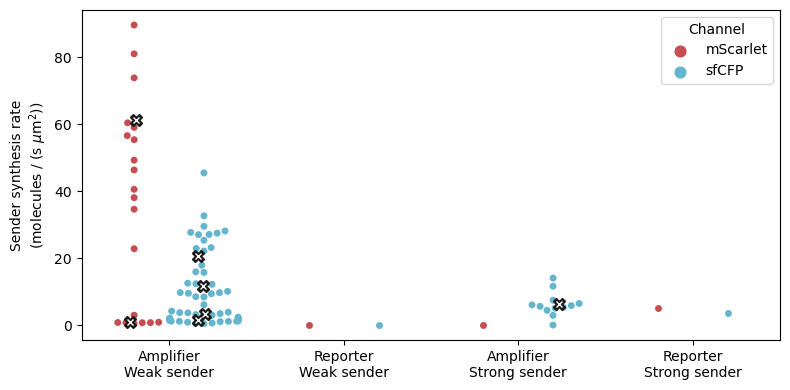

In [64]:
plt.figure(figsize=(6,4))

# Slim down to the data you want to show
# peaks_df.loc[(peaks_df.level>=1)&(peaks_df.level<4)&(peaks_df.frame<85)&(peaks_df.channel>2)&(peaks_df['diff']),:]
plot_df = peaks_df.loc[peaks_df.channel>2,:]
plot_df = plot_df.loc[plot_df['diff']==True,:]
plot_df = plot_df.loc[plot_df['frame']<65,:]
plot_df = plot_df.loc[plot_df['level']<4,:]
plot_df = plot_df.loc[plot_df['level']==2,:]
plot_df = plot_df.loc[plot_df.b_vec,:].copy()

# mdi_vec = [1,4,9,11,14]
# mdi_vec = [1,9,11,4,14]
mdi_x = np.arange(len(mdi_vec))
x_dict = dict(zip(mdi_vec,mdi_x))
x_labs = label_df.loc[mdi_vec,'label']

# Add rows with large times where mdi's are missing
gb_tries = plot_df.groupby(['mdi','channel'])
keys_list = [(xx,yy) for xx in mdi_vec for yy in [3.0,5.0]]
for key in keys_list:
    if not (key in gb_tries.groups.keys()):
        mdi, mask_chan = key
        d_vec = [mdi, mask_chan, 0]
        c_vec = ['mdi','channel','co_ct']
        new_row = pd.DataFrame(dict(zip(c_vec,d_vec)),index=[0])
        plot_df = plot_df.append(new_row, ignore_index=True)

lam = lambda x : x in mdi_vec
plot_df = plot_df.loc[plot_df.mdi.apply(lam),:]
plot_df['label'] = label_df.loc[plot_df['mdi'],'label'].values

# Add columns to make plotting easier
conv_channel = lambda x : dict(zip([3.0,5.0],['mScarlet','sfCFP']))[x]
plot_df['Channel'] = plot_df.channel.apply(conv_channel)

lam = lambda x : x_dict[x]
plot_df['x'] = plot_df.mdi.apply(lam)

color_dict = dict(zip(mma.all_channel_names, mma.mpl_named_colors))

# sns.boxplot(data=plot_df, x='mdl',y='l10_co',hue='Channel', dodge=True, palette=color_dict)
fig, ax = plt.subplots(1,1,figsize=(8,4))
ax = sns.swarmplot(data=plot_df, x='x',y='co_ct',hue='Channel', dodge=True, palette=color_dict,size=5,ax=ax)
mdlabels = list(metadata_gb.groups.keys())
# _ = plt.xticks(np.arange(len(mdlabels)), mdlabels,rotation=30)
_ = ax.set_xticklabels(x_labs)
_ = ax.set_xlabel('')
_ = ax.set_ylabel('Sender synthesis rate\n(molecules / (s $\mu$m$^2$))')
fig.tight_layout()

fit_df['mdi'] = metadata_df.loc[fit_df['pad'],'mdi'].values

lam = lambda x : x in mdi_vec
sub_fit_df = fit_df.loc[fit_df.mdi.apply(lam),:]
sub_fit_df = sub_fit_df.loc[sub_fit_df['exp_count']>5,:]

lam = lambda x : x_dict[x]
sub_fit_df['mdx'] = sub_fit_df.mdi.apply(lam)

chan_dx_dict = {3:-0.23,5:0.23}
lam = lambda x : chan_dx_dict[x]
sub_fit_df['mdx'] += sub_fit_df.channel.apply(lam)

sub_fit_df['mdx'] += np.random.random(len(sub_fit_df))/5-0.12

ax.plot(sub_fit_df.mdx, sub_fit_df.c0, 'kX',zorder=20,ms=8)
ax.plot(sub_fit_df.mdx, sub_fit_df.c0, 'wx',zorder=21,ms=4)

<Figure size 600x400 with 0 Axes>

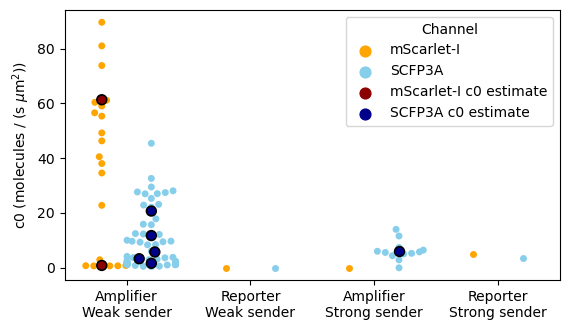

In [65]:
plt.figure(figsize=(6,4))

# Slim down to the data you want to show
# peaks_df.loc[(peaks_df.level>=1)&(peaks_df.level<4)&(peaks_df.frame<85)&(peaks_df.channel>2)&(peaks_df['diff']),:]
plot_df = peaks_df.loc[peaks_df.channel>2,:]
plot_df = plot_df.loc[plot_df['diff']==True,:]
plot_df = plot_df.loc[plot_df['frame']<65,:]
plot_df = plot_df.loc[plot_df['level']<4,:]
plot_df = plot_df.loc[plot_df['level']==2,:]
plot_df = plot_df.loc[plot_df.b_vec,:].copy()

# mdi_vec = [1,4,9,11,14]
# mdi_vec = [1,9,11,4,14]
mdi_x = np.arange(len(mdi_vec))
x_dict = dict(zip(mdi_vec,mdi_x))
x_labs = label_df.loc[mdi_vec,'label']

# Add rows with large times where mdi's are missing
gb_tries = plot_df.groupby(['mdi','channel'])
keys_list = [(xx,yy) for xx in mdi_vec for yy in [3.0,5.0]]
for key in keys_list:
    if not (key in gb_tries.groups.keys()):
        mdi, mask_chan = key
        d_vec = [mdi, mask_chan, 0]
        c_vec = ['mdi','channel','co_ct']
        new_row = pd.DataFrame(dict(zip(c_vec,d_vec)),index=[0])
        plot_df = plot_df.append(new_row, ignore_index=True)

lam = lambda x : x in mdi_vec
plot_df = plot_df.loc[plot_df.mdi.apply(lam),:]
plot_df['label'] = label_df.loc[plot_df['mdi'],'label'].values

# Add columns to make plotting easier
conv_channel = lambda x : dict(zip([3.0,5.0],['mScarlet-I','SCFP3A']))[x]
plot_df['Channel'] = plot_df.channel.apply(conv_channel)

lam = lambda x : x_dict[x]
plot_df['x'] = plot_df.mdi.apply(lam)

color_dict = dict(zip(['mScarlet-I','SCFP3A'], ['orange','skyblue']))

fit_df['mdi'] = metadata_df.loc[fit_df['pad'],'mdi'].values

lam = lambda x : x in mdi_vec
sub_fit_df = fit_df.loc[fit_df.mdi.apply(lam),:].copy()
sub_fit_df = sub_fit_df.loc[sub_fit_df['exp_count']>2,:]

gb_tries = sub_fit_df.groupby(['mdi','channel'])
keys_list = [(xx,yy) for xx in mdi_vec for yy in [3.0,5.0]]
for key in keys_list:
    if not (key in gb_tries.groups.keys()):
        mdi, mask_chan = key
        d_vec = [mdi, mask_chan, 0]
        c_vec = ['mdi','channel','co_ct']
        new_row = pd.DataFrame(dict(zip(c_vec,d_vec)),index=[0])
        sub_fit_df = sub_fit_df.append(new_row, ignore_index=True)

lam = lambda x : x_dict[x]
sub_fit_df['x'] = sub_fit_df.mdi.apply(lam)

# Add columns to make plotting easier
conv_channel = lambda x : dict(zip([3.0,5.0],['mScarlet-I c0 estimate','SCFP3A c0 estimate']))[x]
sub_fit_df['Channel'] = sub_fit_df.channel.apply(conv_channel)
edge_color_dict = dict(zip([3.0,5.0],['black','white']))
conv_channel = lambda x : edge_color_dict[x]
sub_fit_df['edgecolor'] = sub_fit_df.channel.apply(conv_channel)

# chan_dx_dict = {3:-0.23,5:0.23}
# lam = lambda x : chan_dx_dict[x]
# sub_fit_df['mdx'] += sub_fit_df.channel.apply(lam)

# sns.boxplot(data=plot_df, x='mdl',y='l10_co',hue='Channel', dodge=True, palette=color_dict)
fig, ax = plt.subplots(1,1,figsize=(5.8,3.4))
ax = sns.swarmplot(data=plot_df, x='x',y='co_ct',hue='Channel', dodge=True, palette=color_dict,size=5,ax=ax)
xlims = ax.get_xlim()
# mdlabels = list(metadata_gb.groups.keys())
# _ = plt.xticks(np.arange(len(mdlabels)), mdlabels,rotation=30)


color_dict = dict(zip(['mScarlet-I c0 estimate','SCFP3A c0 estimate'],['darkred','darkblue']))

ax = sns.swarmplot(data=sub_fit_df, x='x',y='c0',hue='Channel', hue_order=['mScarlet-I c0 estimate','SCFP3A c0 estimate'],
                   dodge=True, palette=color_dict,size=7,ax=ax,edgecolor='black',linewidth=1.2)
_ = ax.set_xticks(mdi_x)
ax.set_xlim(xlims)
_ = ax.set_xticklabels(x_labs)
_ = ax.set_xlabel('')
_ = ax.set_ylabel('c0 (molecules / (s $\mu$m$^2$))')
fig.tight_layout()
fig_tmpl = 'c0_estimates_200626.{}'
fig_tmpl = os.path.join(acq.super_dir,'figs',fig_tmpl)
for enc in ['png','pdf']:
    fig.savefig(fig_tmpl.format(enc))
# ax.plot(sub_fit_df.mdx, sub_fit_df.c0, 'kX',zorder=20,ms=8)
# ax.plot(sub_fit_df.mdx, sub_fit_df.c0, 'wx',zorder=21,ms=4)

In [222]:
sub_fit_df

,pad,channel,c0,exp_count,mdi,x,Channel,edgecolor
0,3,3.0,0.856706,6,1,0,mScarlet c0 estimate,black
1,3,5.0,1.642691,14,1,0,sfCFP c0 estimate,white
2,4,5.0,11.764094,12,1,0,sfCFP c0 estimate,white
3,6,3.0,NaN,1,1,0,mScarlet c0 estimate,black
4,6,5.0,3.305414,10,1,0,sfCFP c0 estimate,white
5,7,3.0,61.313336,14,1,0,mScarlet c0 estimate,black
6,7,5.0,20.707436,14,1,0,sfCFP c0 estimate,white
7,8,5.0,4.466451,2,1,0,sfCFP c0 estimate,white
8,33,5.0,5.775003,3,1,0,sfCFP c0 estimate,white
11,31,5.0,NaN,1,4,2,sfCFP c0 estimate,white


### Figure of stills

In [104]:
proc.thresh_df

threshold
type ci frame            
arr  0  0        0.000000
        1      198.077814
        2      203.344940
        3      151.130408
        4       89.283624
...                   ...
diff 2  85     169.611285
        86     171.007445
        87     172.554244
        88     174.262077
        89     176.234960

[816 rows x 1 columns]

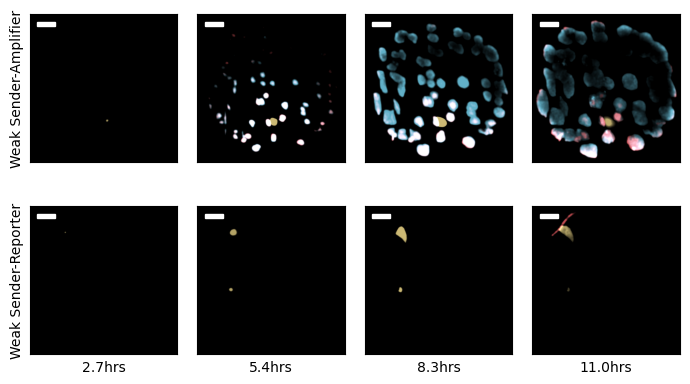

In [66]:
plt.style.use('default')
plt.style.use('fast')
fig, axs = plt.subplots(2,4, figsize=(7,4))
frame_vec = [20,40,60,80]
scale=1
sigma=2
bg_sigma=32
sg_width=9
sg_order=1
print_img=False
bg_option='comb'
im_h, im_w, pxs = acq.im_height, acq.im_width, acq.pixel_size
for ax_i, pad_ind in [(0,7),(1,20)]:
    
    proc = mma.ProcessUnorderedDiff(acq, pad_ind, scale=scale,sigma=sigma,
                                   bg_sigma=bg_sigma,bg_option=bg_option,
                                   sg_order=sg_order,sg_width=sg_width,diff=False,print_img=False)
    proc._setup(False)
    for ax_j, f_i in enumerate(frame_vec):
#         proc._load_arrs(True)
#         proc._setup(False)
        ax = axs[ax_i, ax_j]
        for ci, chan in enumerate([2,3,5]):
            thresh_val = proc.thresh_df.loc[('filt',ci,f_i),'threshold']
            norm_fn = mpl_colors.Normalize(thresh_val/2,thresh_val*6,clip=True)
            proc.pad_helper.pad_arr[:,:,ci] = norm_fn(proc.filt_arr[f_i,ci,:,:])*100
        proc.pad_helper._prep_img_arr()
        proc.pad_helper._prep_norm_arr()
        ax.imshow(proc.pad_helper.norm_arr)
        scale_bar = patches.Rectangle((im_w/20,im_h/20),100/pxs,im_h/40,
                                      color='w',axes=ax,fill=True,alpha=1,visible=True)
        ax.add_patch(scale_bar)
        ax.set_xticks([])
        ax.set_yticks([])
        tdf_key = (f_i, pad_ind)
        if ax_i:
            ax.set_xlabel('{:0.1f}hrs'.format(acq.time_df.loc[tdf_key,'time']/3600))
axs[0,0].set_ylabel('Weak Sender-Amplifier')
axs[1,0].set_ylabel('Weak Sender-Reporter')
fig.tight_layout()
fig_tmpl = '/home/jparkin/groupdir/biotek/summary-analysis/figures/stills_200626.{}'
fig_tmpl = os.path.join(acq.super_dir,'figs',fig_tmpl)
for enc in ['png','pdf']:
    fig.savefig(fig_tmpl.format(enc))

In [140]:
acq.super_dir

'/groups/murray-biocircuits/jparkin/movies/200626_finalday/img_1'

In [142]:
metadata_df.loc[metadata_df.sender=='k25',:]

,inducers,sender,deadcini,skip,sender_present,mdi,label
1,ir,k25,False,False,False,3,Active\nStrong sender\nNo sender
12,ir,k25,False,True,False,5,Active\nStrong sender\nskip\nNo sender
15,r,k25,False,False,False,12,Inactive\nStrong sender\nNo sender
18,r,k25,False,False,True,13,Inactive\nStrong sender
21,r,k25,False,False,True,13,Inactive\nStrong sender
25,r,k25,False,False,False,12,Inactive\nStrong sender\nNo sender
27,r,k25,False,False,True,13,Inactive\nStrong sender
30,r,k25,False,False,True,13,Inactive\nStrong sender
31,ir,k25,False,False,True,4,Active\nStrong sender
32,ir,k25,False,False,False,3,Active\nStrong sender\nNo sender


In [4]:
metadata_df.loc[metadata_df.sender!='k25',:]

,inducers,sender,deadcini,skip,sender_present,mdi,label
0,ir,jao,False,True,True,2,Active\nskip
2,ir,jao,False,False,False,0,Active\nNo sender
3,ir,jao,False,False,True,1,Active
4,ir,jao,False,False,True,1,Active
5,ir,jao,False,False,False,0,Active\nNo sender
6,ir,jao,False,False,True,1,Active
7,ir,jao,False,False,True,1,Active
8,ir,jao,False,False,True,1,Active
9,ir,unk,True,False,False,6,Active\nUnknown sender\nDead Cini\nNo sender
10,ir,unk,True,False,False,6,Active\nUnknown sender\nDead Cini\nNo sender


In [5]:
label_df

,inducers,sender,deadcini,skip,sender_present,label
0,ir,jao,False,False,False,Active\nNo sender
1,ir,jao,False,False,True,Active
2,ir,jao,False,True,True,Active\nskip
3,ir,k25,False,False,False,Active\nStrong sender\nNo sender
4,ir,k25,False,False,True,Active\nStrong sender
5,ir,k25,False,True,False,Active\nStrong sender\nskip\nNo sender
6,ir,unk,True,False,False,Active\nUnknown sender\nDead Cini\nNo sender
7,r,jao,False,False,False,Inactive\nNo sender
8,r,jao,False,False,True,Inactive
9,r,jao,False,True,True,Inactive\nskip
